# Pipeline for AGEP column

Enable auto-reloading of external modules

In [1]:
import pandas as pd
%matplotlib inline
%load_ext autoreload
%autoreload 2

Import dependencies

In [2]:
from pprint import pprint

from utils.data_loader import *
from utils.null_handler import *
from utils.EDA_utils import *
from utils.simple_utils import *
from utils.model_tuning_utils import *
from utils.stability_analysis import *
from utils.analysis_helper import *
from config import *
from utils.StabilityFairnessAnalyzer import StabilityFairnessAnalyzer

import os
import warnings
warnings.filterwarnings('ignore')
os.environ["PYTHONWARNINGS"] = "ignore"

plt.style.use('mpl20')
matplotlib.rcParams['figure.dpi'] = 100
matplotlib.rcParams.update({'font.size': 10})

/home/denys_herasymuk/UCU/Studying_abroad/NYU_Internship/Code/RAI-summer-stability/RAI_venv/lib/python3.8/site-packages/pkg_resources/__init__.py:123: PkgResourcesDeprecationWarning: 0.1.36ubuntu1 is an invalid version and will not be supported in a future release
  warnings.warn(
/home/denys_herasymuk/UCU/Studying_abroad/NYU_Internship/Code/RAI-summer-stability/RAI_venv/lib/python3.8/site-packages/pkg_resources/__init__.py:123: PkgResourcesDeprecationWarning: 0.23ubuntu1 is an invalid version and will not be supported in a future release
  warnings.warn(


In [3]:
try:
    from folktables import ACSDataSource, ACSEmployment
except:
    !pip install folktables
    from folktables import ACSDataSource, ACSEmployment

## Loading ACSEmployment data

In [4]:
TARGET_COLUMN = 'AGEP'
NULL_SCENARIO_NAME = f'Unknown_{TARGET_COLUMN}'
COLUMN_TYPE = get_column_type(TARGET_COLUMN)

In [5]:
X_data, y_data = ACSDataLoader(task=DATASET_CONFIG['task'], state=DATASET_CONFIG['state'], year=DATASET_CONFIG['year'], without_nulls=True)

Original: 24 mb
Optimized: 12 mb

Dataset shape before handling nulls:  (196967, 16)
Impute values:  {'SCHL': 0, 'ESP': 0, 'MIG': 0, 'MIL': 0, 'DREM': 0}
Dataset shape after handling nulls:  (196967, 16)

Rechecking if there are nulls in X_data:
AGEP        0
SCHL        0
MAR         0
RELP        0
DIS         0
ESP         0
CIT         0
MIG         0
MIL         0
ANC         0
NATIVITY    0
DEAR        0
DEYE        0
DREM        0
SEX         0
RAC1P       0
dtype: int64


Check how the target column is balanced

In [6]:
y_data.value_counts()

0    105498
1     91469
Name: ESR, dtype: int64

## Tune hyper-parameters and find the best model

### The best model for a baseline dataset (no nulls)

In [7]:
ML_baseline_results_df = pd.read_csv(os.path.join('..', 'results', 'ML_baseline_results_df.csv'))
ML_baseline_results_df

,Unnamed: 0,Dataset_Name,Model_Name,F1_Score,Accuracy_Score,Model_Best_Params
0,0,Folktables [NY 2018],LogisticRegression,0.7998,0.7999,"{'max_iter': 100, 'penalty': 'l2', 'solver': '..."
1,1,Folktables [NY 2018],DecisionTreeClassifier,0.8229,0.8230,"{'criterion': 'entropy', 'max_depth': 10, 'max..."
2,2,Folktables [NY 2018],XGBClassifier,0.8296,0.8297,"{'learning_rate': 0.1, 'max_depth': 5, 'n_esti..."


## Simulate Null Scenarios

In [8]:
corrupted_data = simulate_scenario(X_data, SIMULATED_SCENARIOS_DICT[NULL_SCENARIO_NAME])

## Impute Nulls

Impute a null scenario with all null-handling techniques

In [9]:
from functools import partial
from utils.NullPredictor import NullPredictor
from utils.NullImputer import NullImputer
from utils.null_helpers import base_regressor, base_knn

input_columns = [col for col in corrupted_data.columns if col != TARGET_COLUMN]
# base_regressor = {'categorical': LogisticRegression(multi_class='multinomial'), 'numerical': LinearRegression()}
# base_knn = {'categorical': KNeighborsClassifier(n_neighbors=5, weights='distance'),
#             'numerical': KNeighborsRegressor(n_neighbors=5, weights='distance')}
X_train, X_test, y_train, y_test = train_test_split(corrupted_data, y_data, test_size=TEST_SET_FRACTION, random_state=SEED)

In [10]:
null_handling_procedures = {
    "Special": NullImputer([TARGET_COLUMN], how="special", trimmed=0, conditional_column=None, special_value=0),
    "Mean" : NullImputer([TARGET_COLUMN], how="mean", trimmed=0, conditional_column=None),
    "Trimmed-mean": NullImputer([TARGET_COLUMN], how="mean", trimmed=10, conditional_column=None),
    "Sex-conditional-mean": NullImputer([TARGET_COLUMN], how="mean", trimmed=0, conditional_column='SEX'),
    "Race-conditional-mean": NullImputer([TARGET_COLUMN], how="mean", trimmed=0, conditional_column='RAC1P'),
    "Median" : NullImputer([TARGET_COLUMN], how="median", trimmed=0, conditional_column=None),
    "Trimmed-median": NullImputer([TARGET_COLUMN], how="median", trimmed=10, conditional_column=None),
    "Sex-conditional-median": NullImputer([TARGET_COLUMN], how="median", trimmed=0, conditional_column='SEX'),
    "Race-conditional-median": NullImputer([TARGET_COLUMN], how="median", trimmed=0, conditional_column='RAC1P'),
    "Regression": NullPredictor(base_classifier=partial(base_regressor), target_columns=[TARGET_COLUMN],
                                input_columns = input_columns, categorical_columns=COLUMN_TO_TYPE['categorical'],
                                numerical_columns=COLUMN_TO_TYPE['numerical']),
    "kNN": NullPredictor(base_classifier=partial(base_knn, n_neighbors=5), target_columns=[TARGET_COLUMN],
                          input_columns = input_columns, categorical_columns=COLUMN_TO_TYPE['categorical'],
                          numerical_columns=COLUMN_TO_TYPE['numerical'])
}

In [11]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer

imputed_data_dict = dict()
for procedure in null_handling_procedures.keys():
    null_handler = null_handling_procedures[procedure]

    # TODO: do I need to do a copy of y_train_imputed?
    X_train_imputed = null_handler.fit_transform(X_train)
    X_test_imputed = null_handler.transform(X_test)
    test_groups = load_groups_of_interest(os.path.join('..', 'groups.json'), X_test_imputed)

    encoder = ColumnTransformer(transformers=[
        ('categorical_features', OneHotEncoder(handle_unknown='ignore', sparse=False), COLUMN_TO_TYPE['categorical']),
        # ('numerical_features', StandardScaler(), COLUMN_TO_TYPE['numerical'])])
    ])

    X_train_features = encoder.fit_transform(X_train_imputed)
    X_test_features = encoder.transform(X_test_imputed)
    # X_train_features = pd.DataFrame(encoder.fit_transform(X_train), columns=X_train_imputed.columns)
    # X_test_features = pd.DataFrame(encoder.transform(X_test), columns=X_test_imputed.columns)
    # X_train_features = make_feature_df(X_train_imputed, COLUMN_TO_TYPE['categorical'], )

    imputed_data_dict[procedure] = {'X_data': (X_train_features, X_test_features), 'test_groups': test_groups}

In [12]:
imputed_with_datawig_full_df = pd.read_csv(os.path.join('..', 'results', 'imputed_with_datawig_full_df.csv'))
imputed_with_datawig_full_df.drop('Unnamed: 0', axis=1, inplace=True)
imputed_with_datawig_full_df.head()

,AGEP,SCHL,MAR,RELP,DIS,ESP,CIT,MIG,MIL,ANC,NATIVITY,DEAR,DEYE,DREM,SEX,RAC1P
0,26.0,21.0,5,17,2,0.0,5,1.0,4.0,1,2,2,2,2.0,2,1
1,21.0,20.0,5,17,2,0.0,1,3.0,4.0,1,1,2,2,2.0,1,1
2,18.0,16.0,5,17,2,0.0,2,3.0,4.0,1,1,2,2,2.0,2,8
3,85.0,16.0,2,16,1,0.0,1,1.0,4.0,4,1,1,2,1.0,2,1
4,19.0,19.0,5,17,2,0.0,1,1.0,4.0,2,1,2,2,2.0,2,1


In [13]:
datawig_train, datawig_test = train_test_split(imputed_with_datawig_full_df, test_size=TEST_SET_FRACTION, random_state=SEED)
imputed_data_dict['datawig'] = (datawig_train, datawig_test)
X_train_baseline, X_test_baseline = train_test_split(X_data, test_size=TEST_SET_FRACTION, random_state=SEED)
imputed_data_dict['baseline'] = (X_train_baseline, X_test_baseline)

### Tune models on imputed datasets

*****************************
kNN
Tuning for LogisticRegression is finished
####################  Folktables [NY 2018]  ####################
Test model:  LogisticRegression
Test model parameters:
{'max_iter': 50, 'penalty': 'l2', 'solver': 'lbfgs'}

              precision    recall  f1-score   support

           0      0.536     0.941     0.683     21095
           1      0.477     0.062     0.110     18299

    accuracy                          0.533     39394
   macro avg      0.507     0.502     0.397     39394
weighted avg      0.509     0.533     0.417     39394



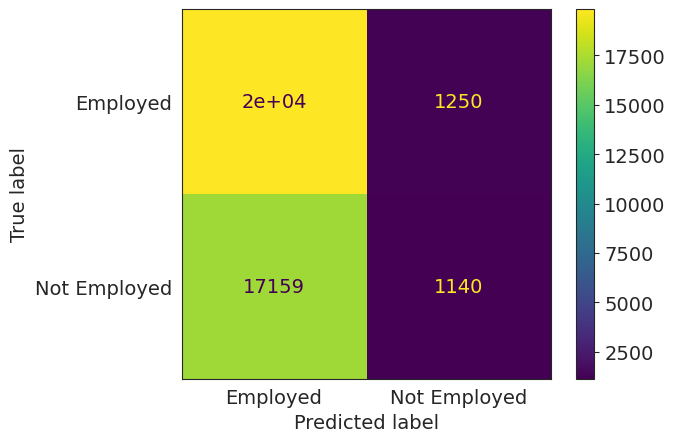

Tuning for DecisionTreeClassifier is finished
####################  Folktables [NY 2018]  ####################
Test model:  DecisionTreeClassifier
Test model parameters:
{'criterion': 'entropy', 'max_depth': 10, 'max_features': 'sqrt'}

              precision    recall  f1-score   support

           0      0.536     0.957     0.687     21095
           1      0.467     0.044     0.080     18299

    accuracy                          0.533     39394
   macro avg      0.501     0.500     0.383     39394
weighted avg      0.504     0.533     0.405     39394



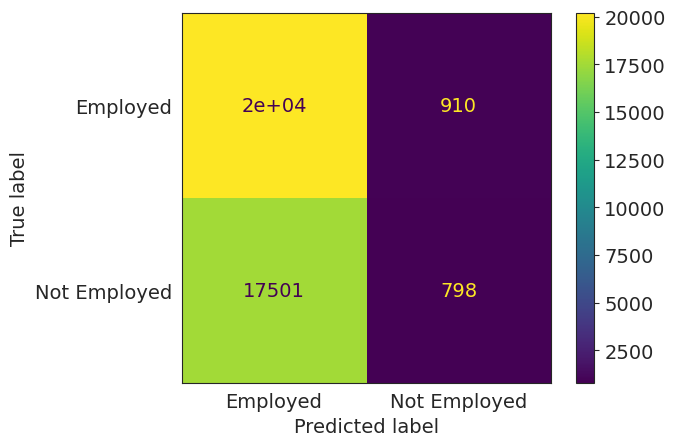

Tuning for XGBClassifier is finished
####################  Folktables [NY 2018]  ####################
Test model:  XGBClassifier
Test model parameters:
{'learning_rate': 0.1,
 'max_depth': 9,
 'n_estimators': 300,
 'objective': 'binary:logistic'}

              precision    recall  f1-score   support

           0      0.540     0.749     0.627     21095
           1      0.476     0.263     0.339     18299

    accuracy                          0.523     39394
   macro avg      0.508     0.506     0.483     39394
weighted avg      0.510     0.523     0.493     39394



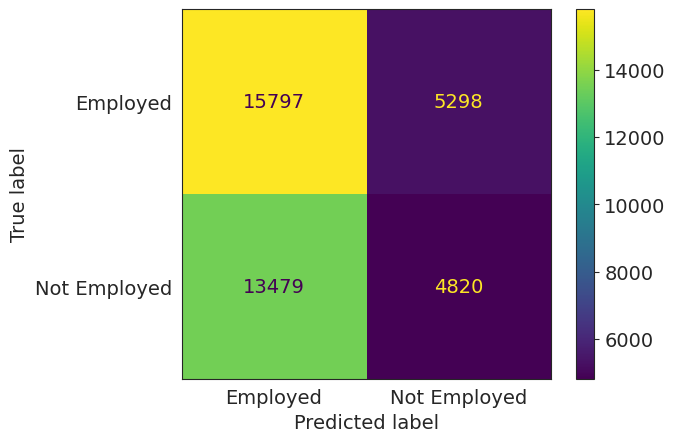

In [18]:
from imblearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer

procedure_result_dfs = dict()
# for procedure in ["kNN", "Regression", "Mean"]:
for procedure in ["kNN"]:
    print("*****************************")
    print(procedure)
    null_handler = null_handling_procedures[procedure]
    encoder = ColumnTransformer(transformers=[
        ('categorical_features', OneHotEncoder(handle_unknown='ignore', sparse=False), COLUMN_TO_TYPE['categorical']),
        ('numerical_features', StandardScaler(), COLUMN_TO_TYPE['numerical'])])
    X_train_imputed = null_handler.fit_transform(X_train)
    X_test_imputed = null_handler.transform(X_test)
    test_groups = load_groups_of_interest(os.path.join('..', 'groups.json'), X_test_imputed)
    X_train_features = encoder.fit_transform(X_train_imputed)
    X_test_features = encoder.transform(X_test_imputed)

    procedure_result_dfs[procedure] = test_models(X_train_features, y_train, X_test_features, y_test)

In [19]:
procedure_result_dfs["kNN"]

,Dataset_Name,Model_Name,F1_Score,Accuracy_Score,Model_Best_Params
0,Folktables [NY 2018],LogisticRegression,0.396674,0.532695,"{'max_iter': 50, 'penalty': 'l2', 'solver': 'l..."
1,Folktables [NY 2018],DecisionTreeClassifier,0.383279,0.532645,"{'criterion': 'entropy', 'max_depth': 10, 'max..."
2,Folktables [NY 2018],XGBClassifier,0.483230,0.523354,"{'learning_rate': 0.1, 'max_depth': 9, 'n_esti..."


## Quantifying uncertainty using posterior predictive distribution

In [15]:
matplotlib.rcParams.update({'font.size': 14})
imputation_techniques = list(imputed_data_dict.keys())
imputation_techniques

['Special',
 'Mean',
 'Trimmed-mean',
 'Sex-conditional-mean',
 'Race-conditional-mean',
 'Median',
 'Trimmed-median',
 'Sex-conditional-median',
 'Race-conditional-median',
 'Regression',
 'kNN',
 'datawig',
 'baseline']

### Plots notes

Notes is based on [this paper](https://www.osti.gov/servlets/purl/1527311).

**Probability mean vs Standard deviation**
* The closer a sample is to the decision boundary, the more likely that small changes in the input data or parameters will change the predicted class.
* To gain a general understanding about the relative instability of individual classifications, we calculate the absolute difference between the number of times a sample is classified as employed or not employed and call this calculation **label stability**.
* When a sample is close to the boundary of a decision surface, perturbations in the data often cause the classifiers' to label the sample differently. Identifying which samples fall into this range, allows us to measure the relative stability of an individual classification.


**Standard deviation vs Label stability and Probability mean vs Label stability**
* Shows the correlation between probability mean, standard deviation and label stability.
* Label stability is defined as the absolute difference between the number of times the sample is classified as 0 and 1.
    * If the absolute difference is large, the label is more stable
    * If the difference is exactly zero then it's extremely unstable --- equally likely to be classified as 0 or 1


**Accuracy vs Standard deviation**
* When it is given the same label with a probability of 100%, each tree's classification of a sample is a binary decision. With 100 trees, each giving 100% probability to its prediction, the calculations of mean and standard deviation can **only result in certain values.** In this case the plot should have a shape of an arc, like here:

![image](https://user-images.githubusercontent.com/42843889/180245566-2312a79d-977f-4a56-89ac-1404c807b80e.png)

* For example for KNN based on this kind of plot, we can notice that as the number of neighbors increase, the stability of the classifiers increases, so there are lower standard deviation values. The standard deviation values show less correlation to accuracy as the number of neighbors increases. The overall accuracy is also decreased suggesting that the models are underfitting the training data.


**Accuracy vs Interquartile range**
* The interquartile range provides a measure of variability as the difference between the third and first quartiles.


In [16]:
y_data_tpl = (y_train, y_test)

def get_evaluation_model():
    # Set hyper-parameters for the best model. Use hyper-parameters, which were tuned on a drop-column dataset
    ML_drop_column_results_df = pd.read_csv(os.path.join('..', 'results', NULL_SCENARIO_NAME, f'{NULL_SCENARIO_NAME}_ML_drop_column_results_df.csv'))
    hyperparameters_dict = eval(ML_drop_column_results_df.loc[ML_drop_column_results_df['Model_Name'] == 'DecisionTreeClassifier',
                                                              'Model_Best_Params'].iloc[0])
    return DecisionTreeClassifier(criterion=hyperparameters_dict['criterion'],
                                  max_depth=hyperparameters_dict['max_depth'],
                                  max_features=hyperparameters_dict['max_features'])


def get_evaluation_model2():
    # Set hyper-parameters for the best model. Use hyper-parameters, which were tuned on a drop-column dataset
    ML_drop_column_results_df = pd.read_csv(os.path.join('..', 'results', NULL_SCENARIO_NAME, f'{NULL_SCENARIO_NAME}_ML_drop_column_results_df.csv'))
    hyperparameters_dict = eval(ML_drop_column_results_df.loc[ML_drop_column_results_df['Model_Name'] == 'XGBClassifier',
                                                              'Model_Best_Params'].iloc[0])
    return XGBClassifier(
            learning_rate=hyperparameters_dict['learning_rate'],
            max_depth=hyperparameters_dict['max_depth'],
            # n_estimators=hyperparameters_dict['n_estimators'],
            n_estimators=100,
            objective=hyperparameters_dict['objective']
        )

### Baseline technique

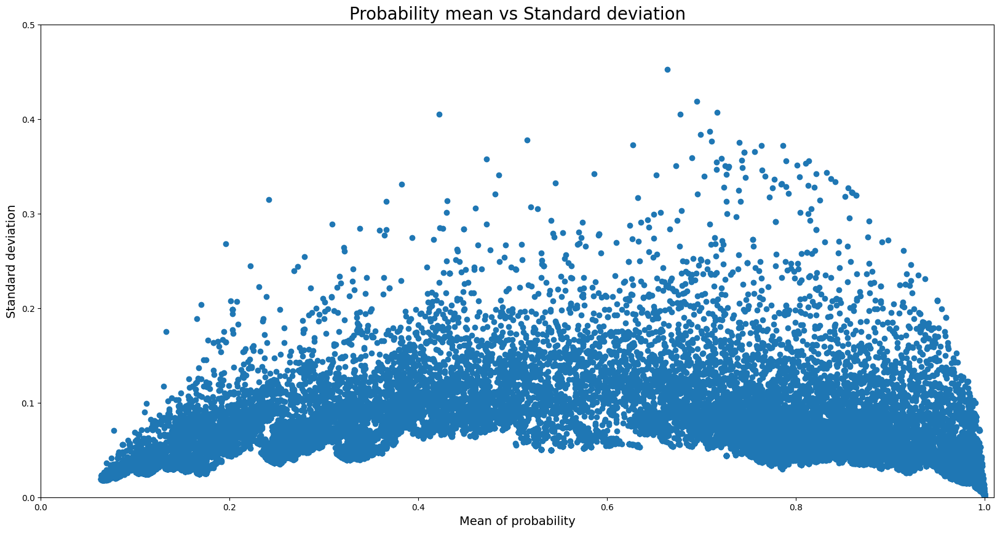

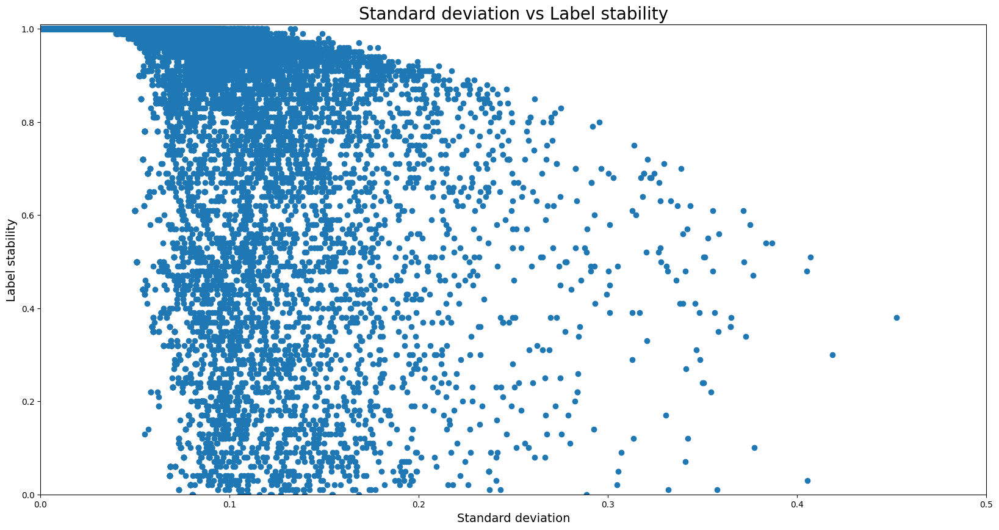

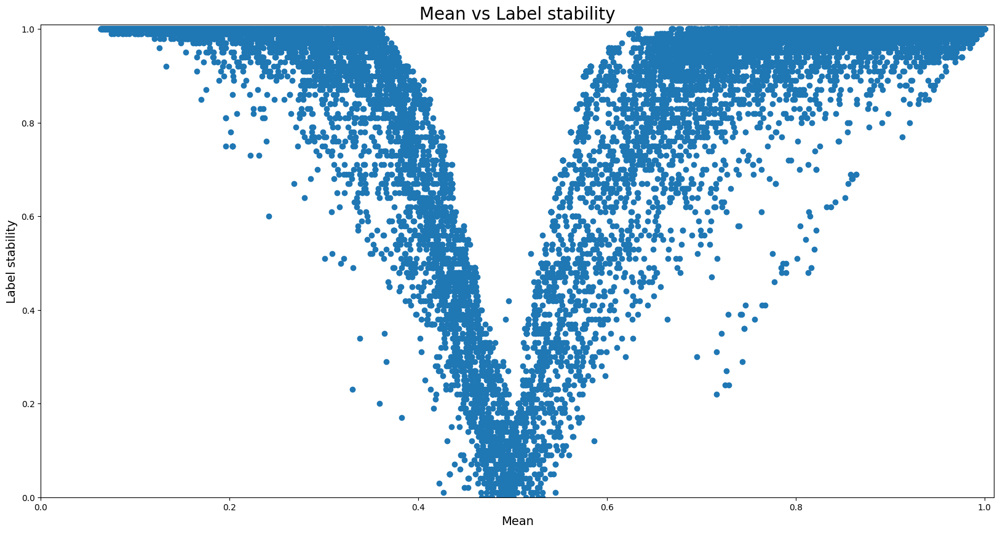

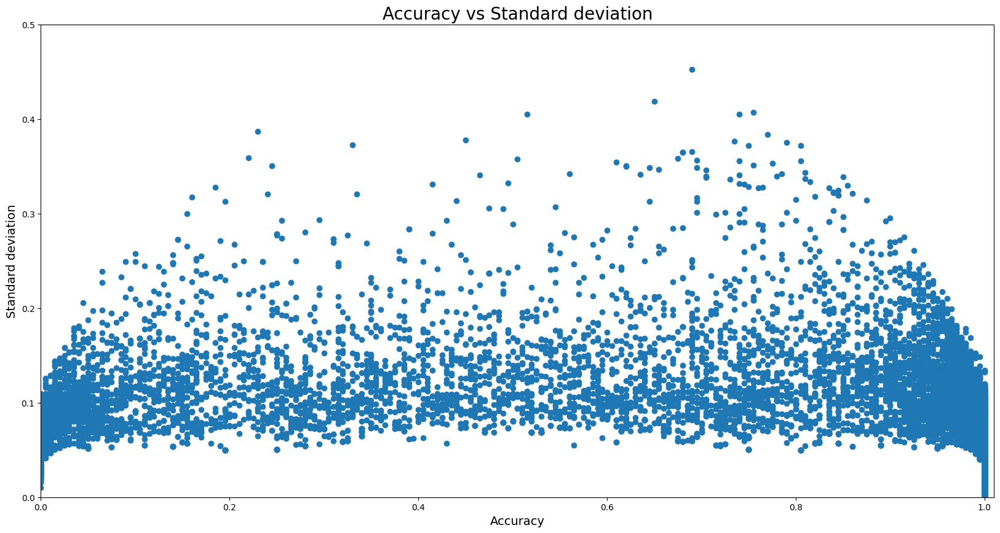

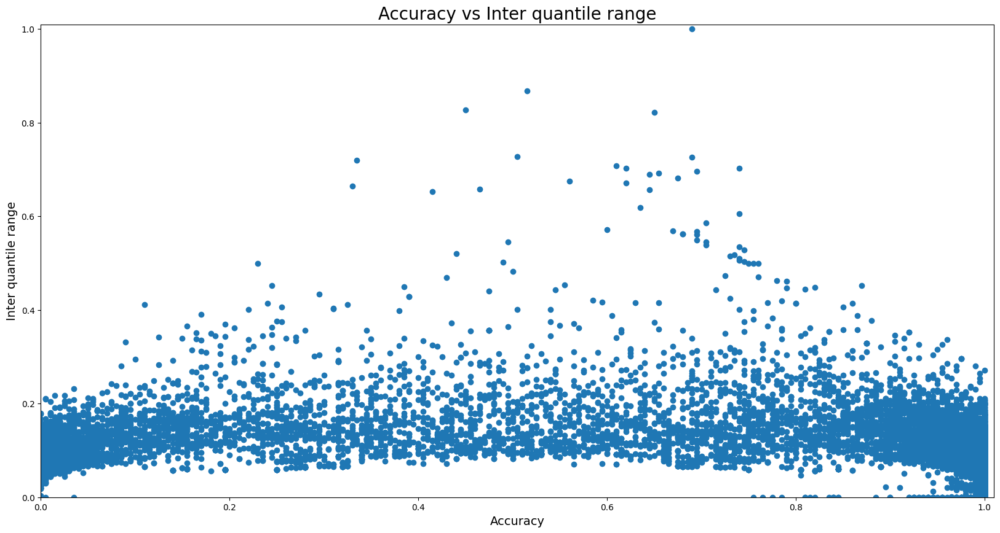

############################## Fairness metrics ##############################

#################### Accuracy ####################
              Race       Sex  Race_Sex
adv       0.829713  0.845448  0.844228
disadv    0.823856  0.809088  0.804858
Accuracy  0.005856  0.036361  0.039369

#################### Disparate_Impact ####################
                      Race       Sex  Race_Sex
adv               0.513940  0.515735  0.520496
disadv            0.483112  0.515203  0.510931
Disparate_Impact  0.940017  0.998970  0.981623

#################### Equal_Opportunity ####################
                       Race       Sex  Race_Sex
adv                0.862121  0.870859  0.862130
disadv             0.861895  0.865467  0.854545
Equal_Opportunity  0.000226  0.005392  0.007584

#################### Statistical_Parity_Difference ####################
                                   Race       Sex  Race_Sex
adv                            1.083120  1.059104  1.033588
disadv             

In [36]:
imputation_technique = 'baseline'
evaluation_model = get_evaluation_model()
baseline_analyzer = StabilityFairnessAnalyzer(imputed_data_dict[imputation_technique], y_data_tpl, evaluation_model,
                                              imputation_technique, NULL_SCENARIO_NAME)
baseline_analyzer.measure_metrics()

### Datawig imputation technique

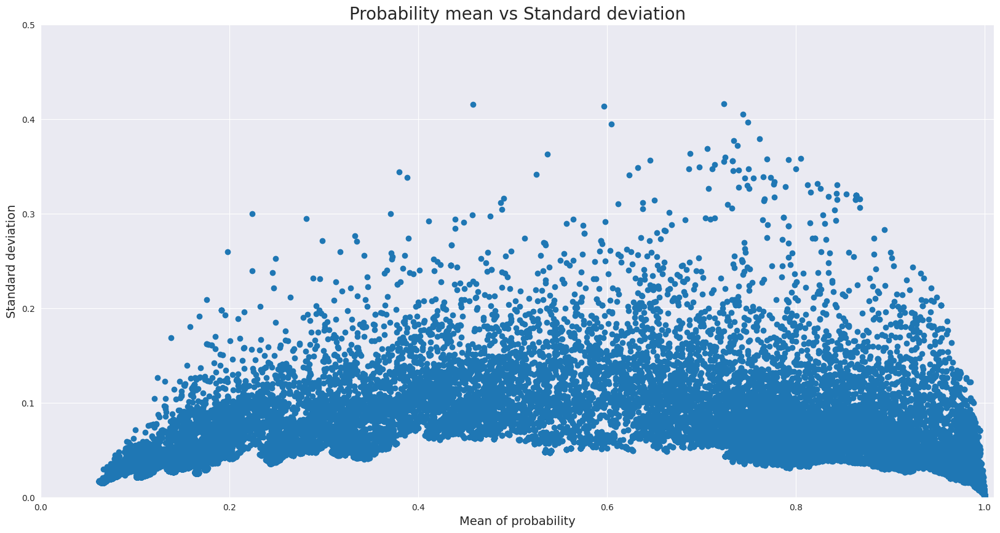

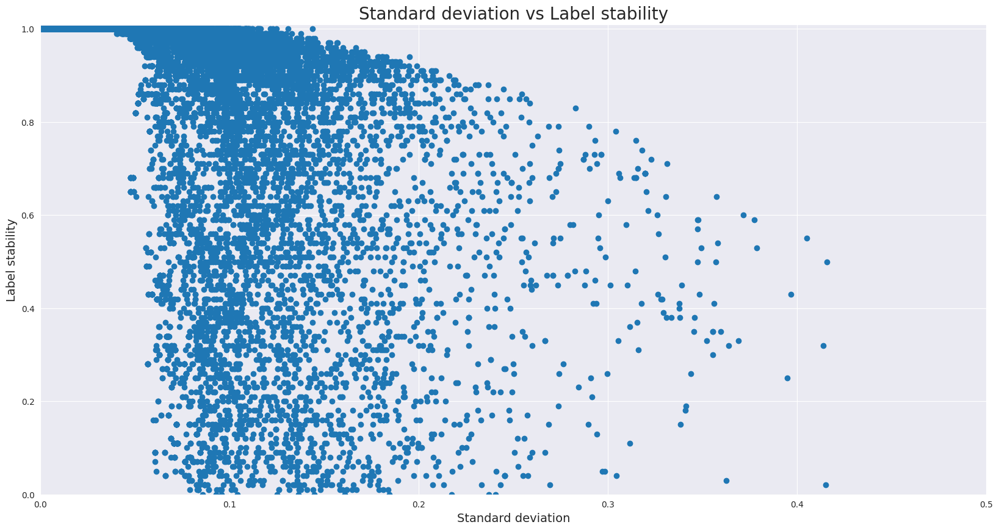

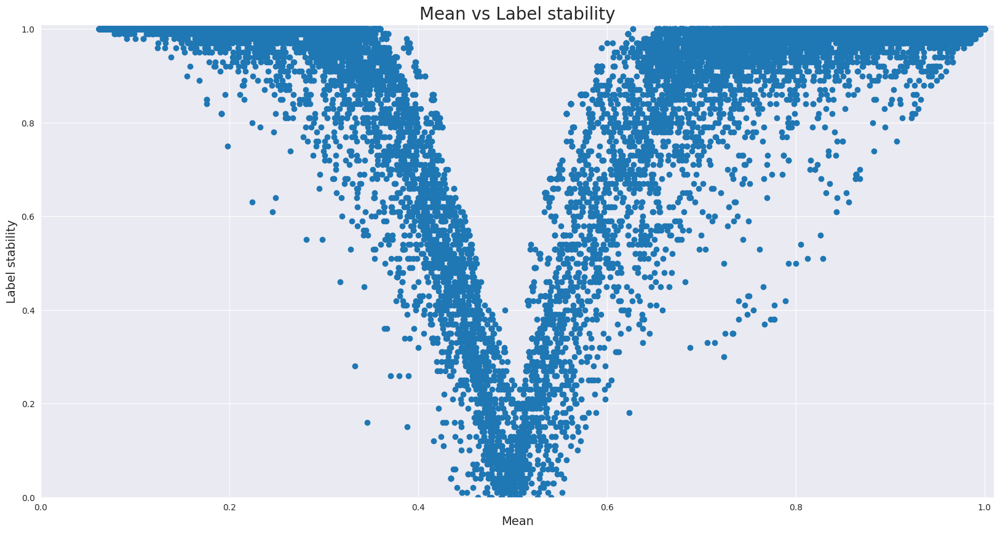

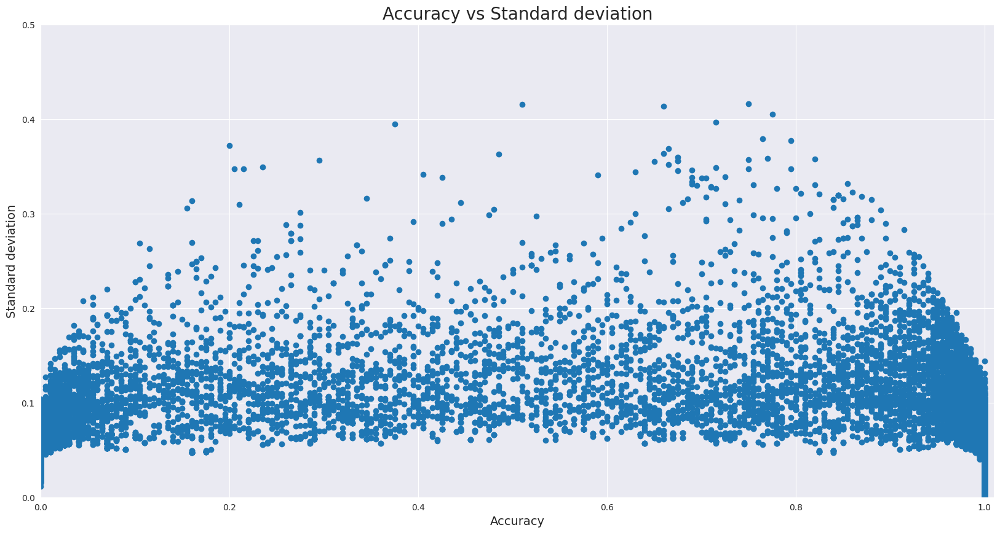

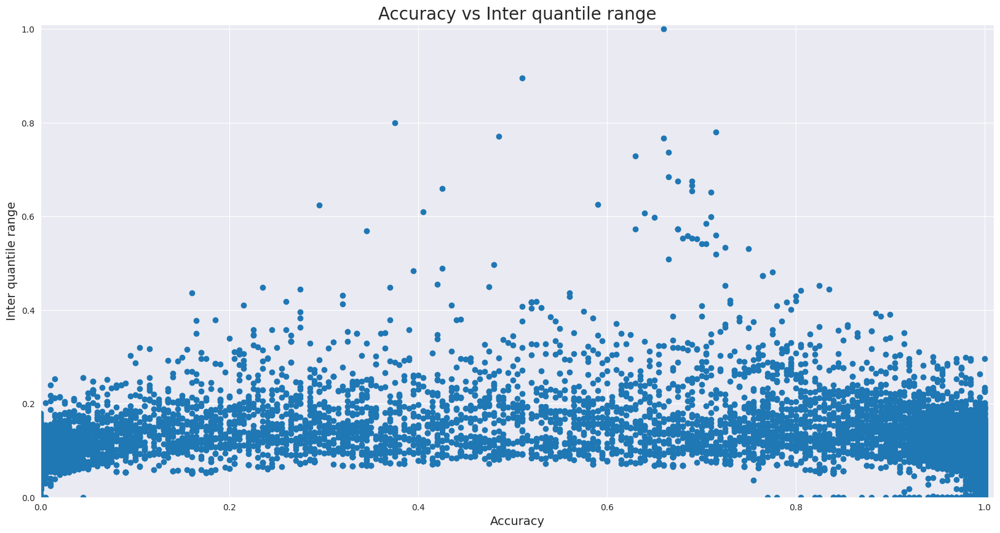

############################## Fairness metrics ##############################

#################### Accuracy ####################
              Race       Sex  Race_Sex
adv       0.829355  0.845237  0.844006
disadv    0.822360  0.808353  0.802834
Accuracy  0.006995  0.036884  0.041172

#################### Disparate_Impact ####################
                      Race       Sex  Race_Sex
adv               0.513010  0.516473  0.521309
disadv            0.482044  0.512412  0.507287
Disparate_Impact  0.939639  0.992139  0.973104

#################### Equal_Opportunity ####################
                       Race       Sex  Race_Sex
adv                0.860763  0.871401  0.862716
disadv             0.858871  0.861494  0.848182
Equal_Opportunity  0.001892  0.009906  0.014535

#################### Statistical_Parity_Difference ####################
                                   Race       Sex  Race_Sex
adv                            1.081159  1.060619  1.035201
disadv             

In [39]:
imputation_technique = 'datawig'
evaluation_model = get_evaluation_model()
datawig_analyzer = StabilityFairnessAnalyzer(imputed_data_dict[imputation_techniques], y_data_tpl, evaluation_model,
                                             imputation_technique, NULL_SCENARIO_NAME)
datawig_analyzer.measure_metrics()

### kNN imputation technique

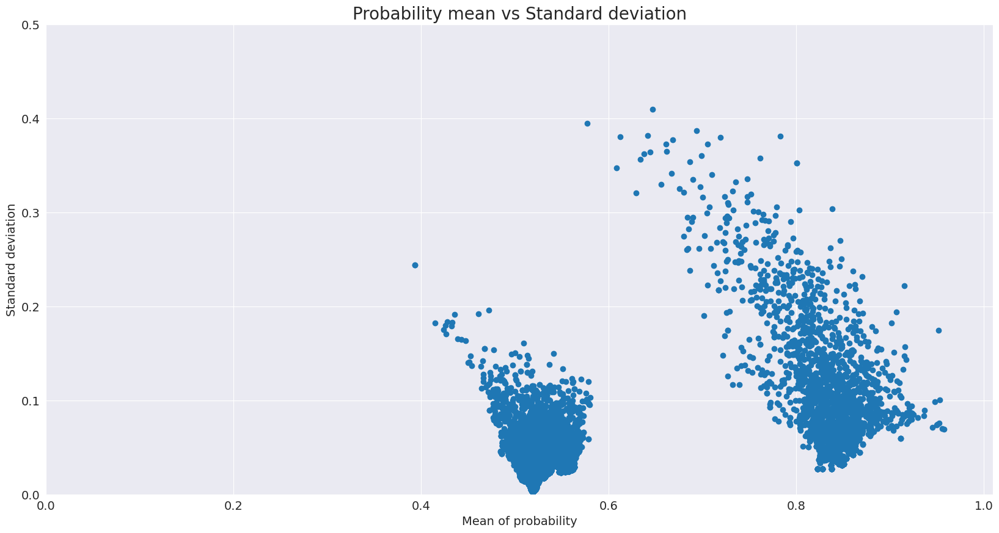

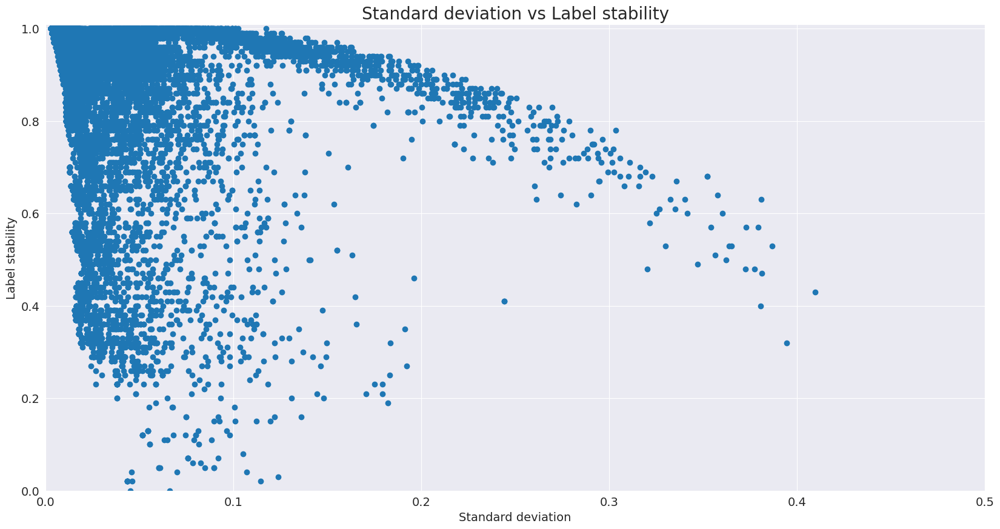

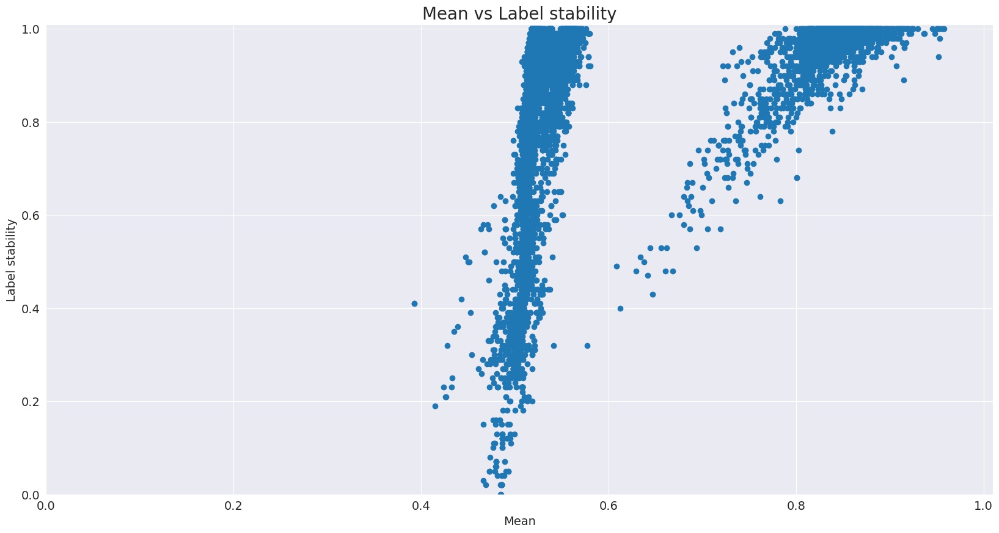

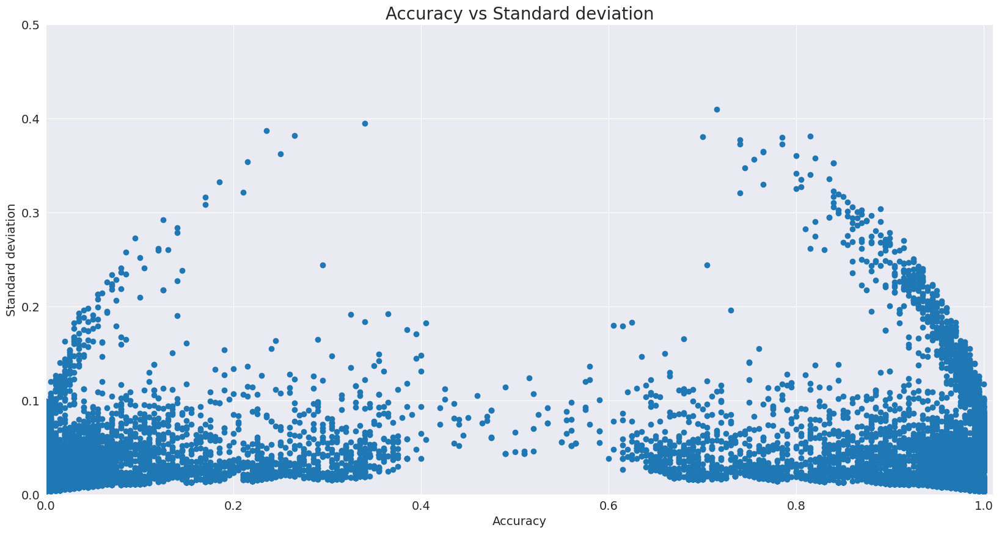

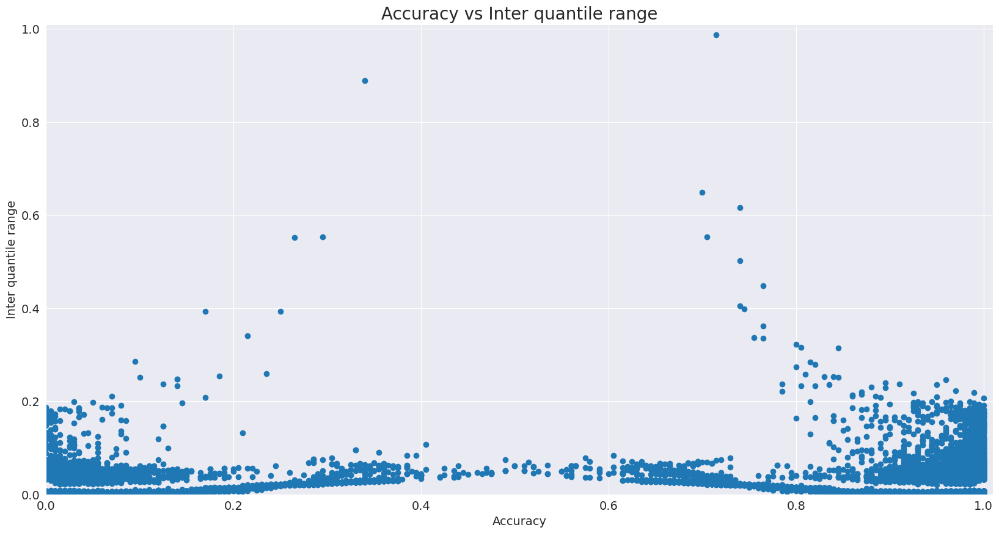

############################## Fairness metrics ##############################

#################### Accuracy ####################
              Race       Sex  Race_Sex
adv       0.532236  0.534303  0.530959
disadv    0.543990  0.535809  0.547381
Accuracy -0.011754 -0.001506 -0.016422

#################### Disparate_Impact ####################
                      Race       Sex  Race_Sex
adv               0.007164  0.008773  0.007241
disadv            0.006815  0.007810  0.005393
Disparate_Impact  0.951397  0.890269  0.744772

#################### Equal_Opportunity ####################
                       Race       Sex  Race_Sex
adv                0.007047  0.009364  0.007253
disadv             0.005906  0.007631  0.004270
Equal_Opportunity  0.001141  0.001733  0.002983

#################### Statistical_Parity_Difference ####################
                                   Race       Sex  Race_Sex
adv                            0.015333  0.018840  0.015453
disadv             

In [17]:
imputation_technique = 'kNN'
evaluation_model = get_evaluation_model()
kNN_analyzer = StabilityFairnessAnalyzer(imputed_data_dict[imputation_technique]['X_data'], y_data_tpl,
                                         imputed_data_dict[imputation_technique]['test_groups'], evaluation_model,
                                         imputation_technique, NULL_SCENARIO_NAME, n_estimators=200)
kNN_analyzer.measure_metrics()

### Regression imputation technique

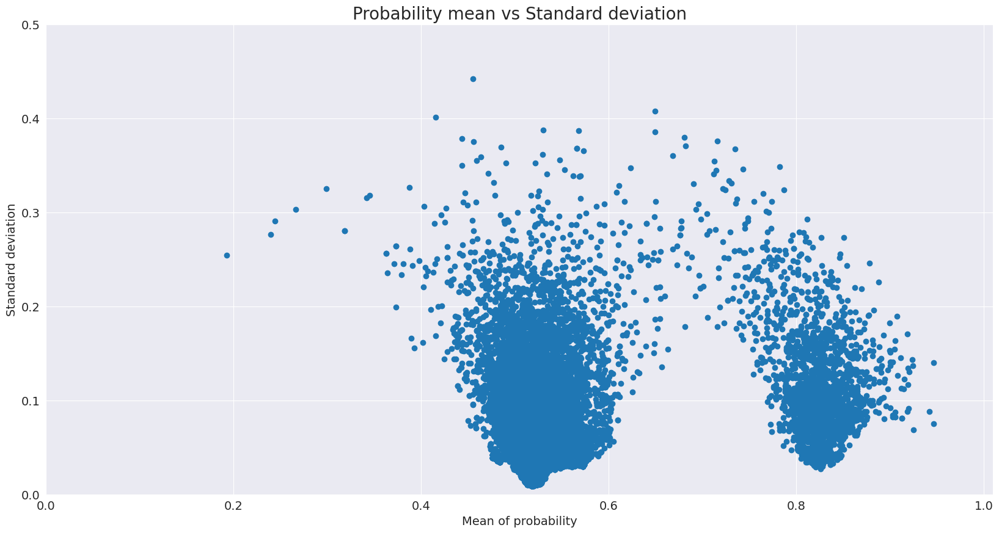

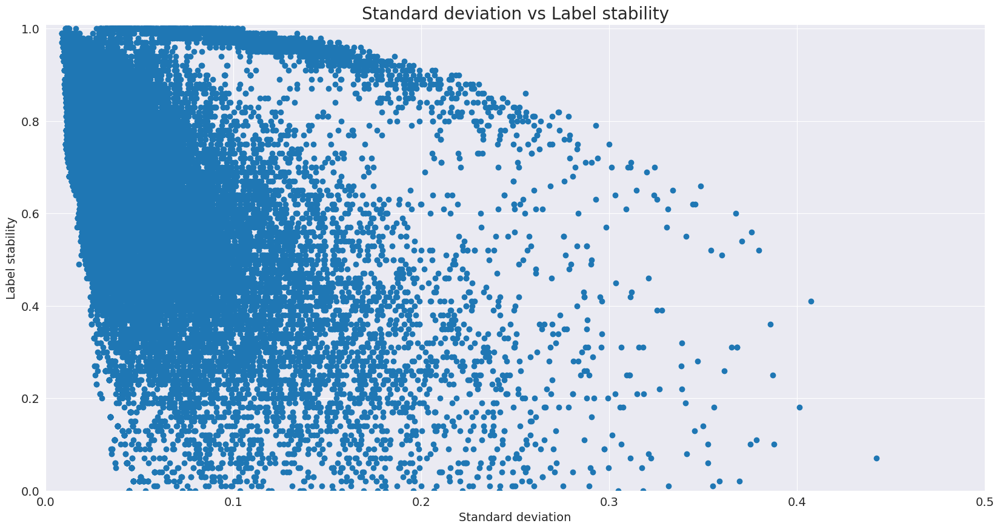

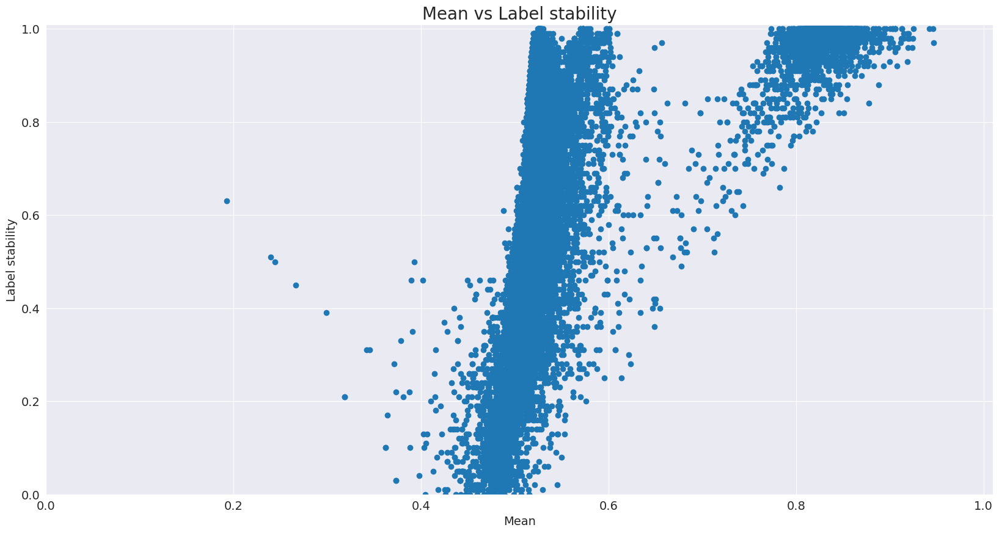

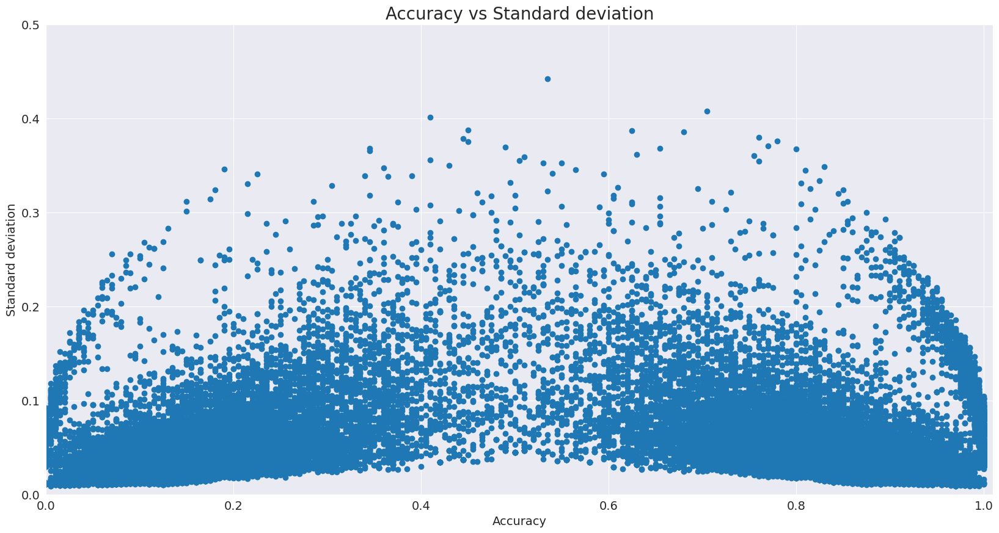

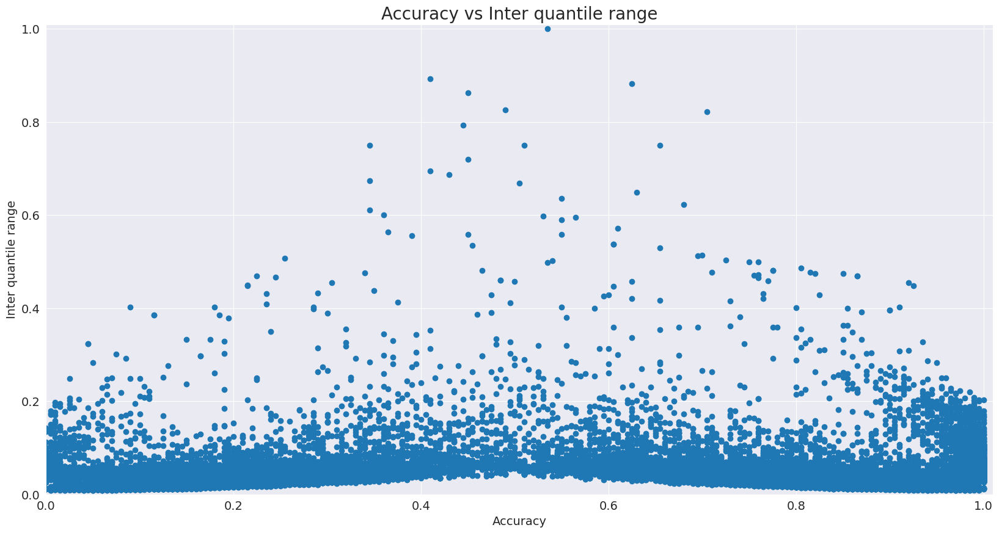

############################## Fairness metrics ##############################

#################### Accuracy ####################
              Race       Sex  Race_Sex
adv       0.530318  0.531152  0.528595
disadv    0.541099  0.533599  0.546225
Accuracy -0.010780 -0.002447 -0.017630

#################### Disparate_Impact ####################
                      Race       Sex  Race_Sex
adv               0.048372  0.046701  0.044037
disadv            0.037794  0.054819  0.035824
Disparate_Impact  0.781327  1.173824  0.813501

#################### Equal_Opportunity ####################
                       Race       Sex  Race_Sex
adv                0.049098  0.046706  0.043992
disadv             0.036801  0.055962  0.036721
Equal_Opportunity  0.012296 -0.009256  0.007272

#################### Statistical_Parity_Difference ####################
                                   Race       Sex  Race_Sex
adv                            0.103539  0.100293  0.093977
disadv             

In [31]:
imputation_technique = 'Regression'
evaluation_model = get_evaluation_model()
regression_analyzer = StabilityFairnessAnalyzer(imputed_data_dict[imputation_technique], y_data_tpl, evaluation_model,
                                         imputation_technique, NULL_SCENARIO_NAME)
regression_analyzer.measure_metrics()

### Impute-by-mean technique

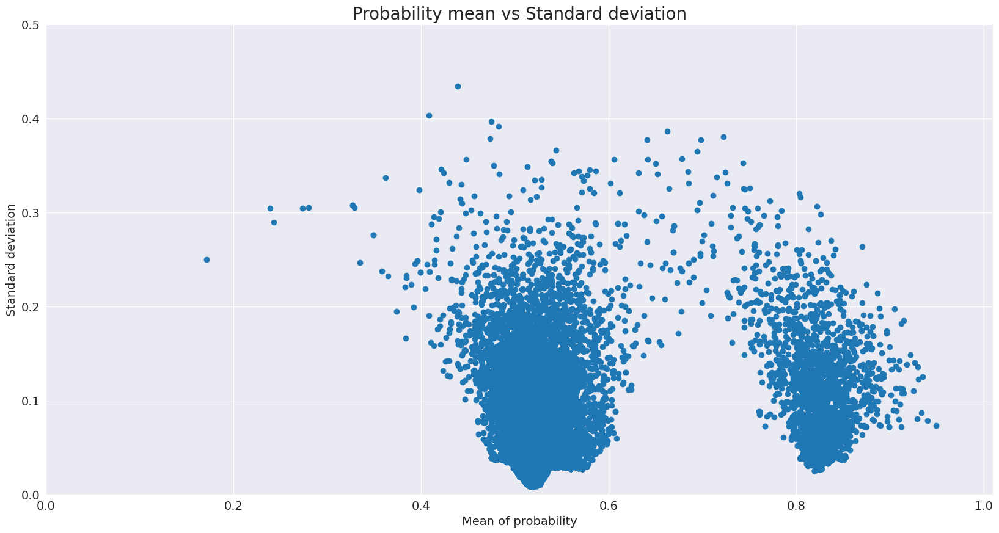

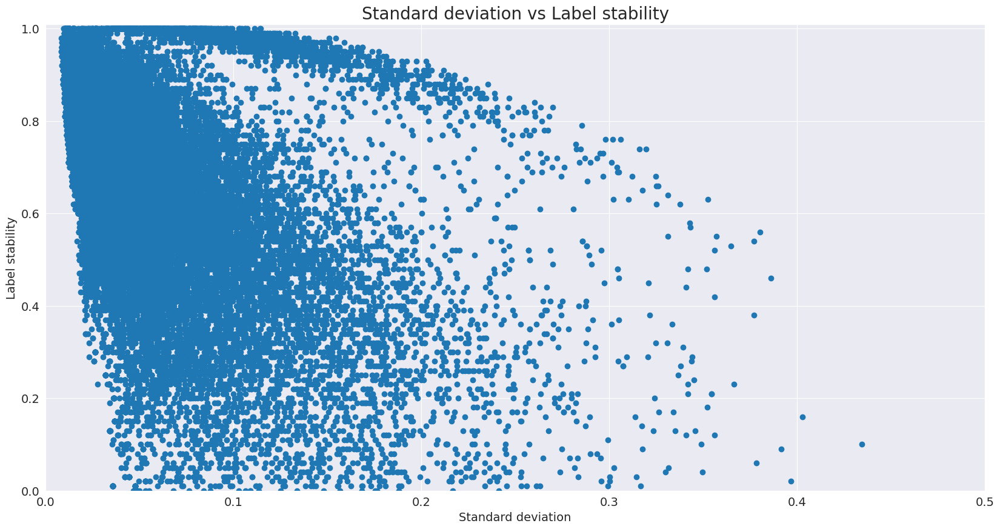

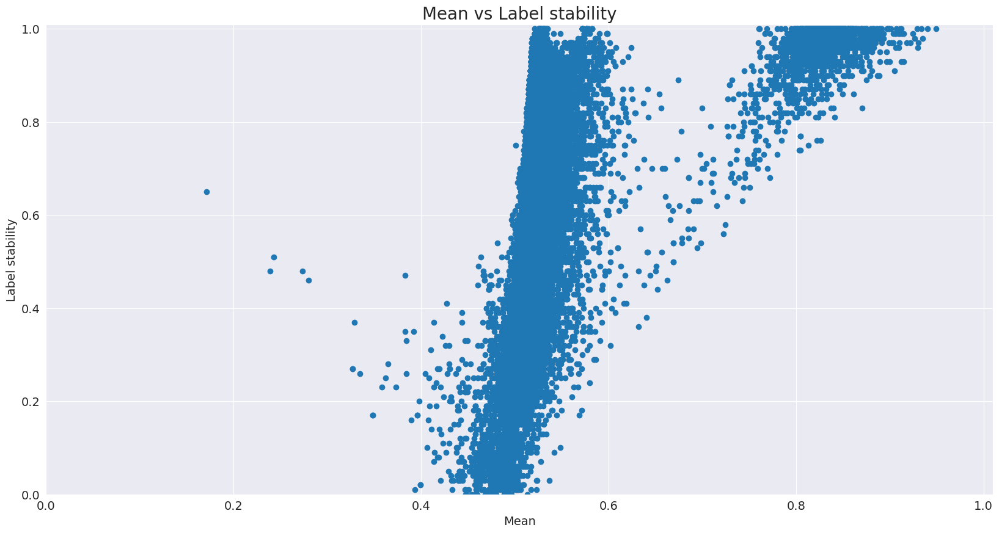

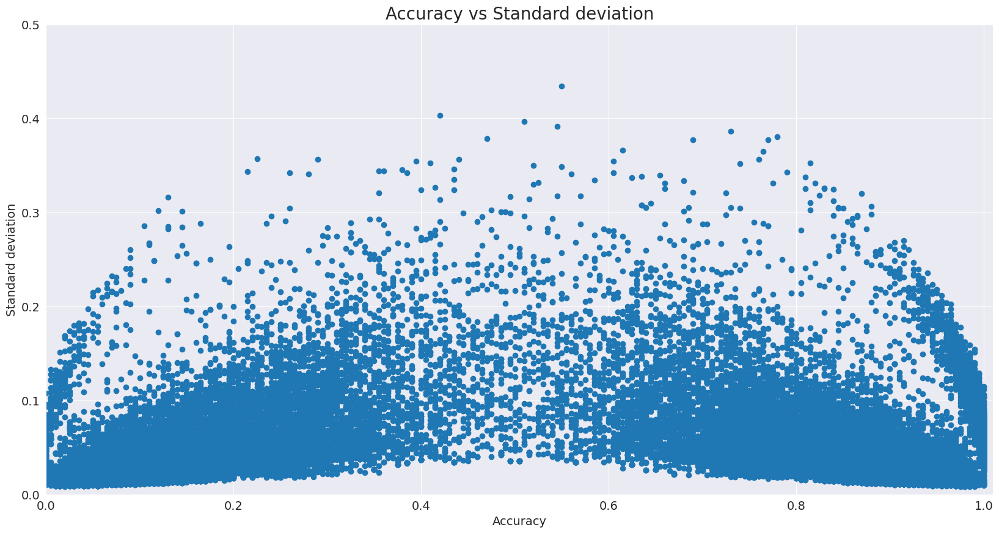

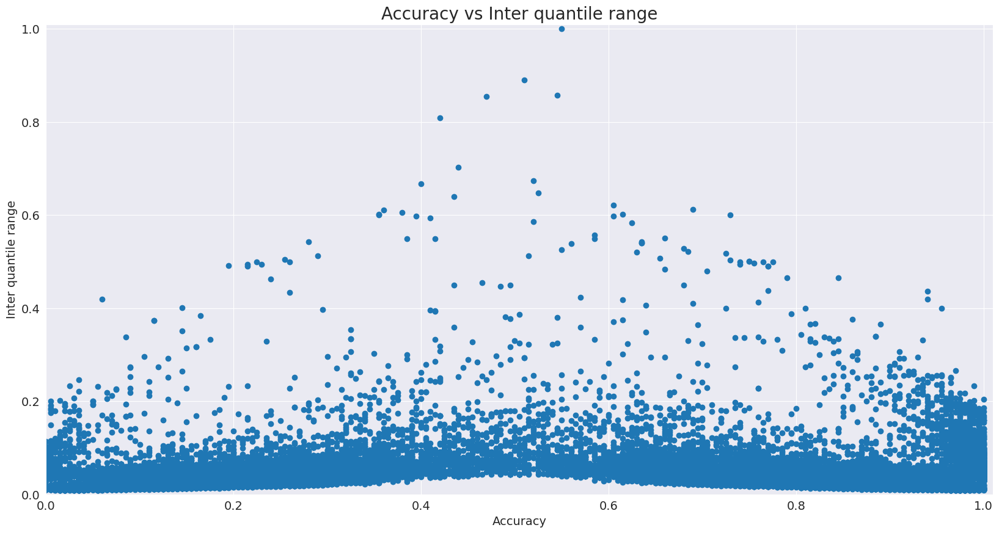

############################## Fairness metrics ##############################

#################### Accuracy ####################
              Race       Sex  Race_Sex
adv       0.530463  0.531939  0.528890
disadv    0.543990  0.533599  0.548151
Accuracy -0.013527 -0.001659 -0.019261

#################### Disparate_Impact ####################
                      Race       Sex  Race_Sex
adv               0.047142  0.048329  0.045072
disadv            0.039447  0.051380  0.036210
Disparate_Impact  0.836762  1.063125  0.803377

#################### Equal_Opportunity ####################
                       Race       Sex  Race_Sex
adv                0.047936  0.049301  0.045412
disadv             0.041799  0.052252  0.039283
Equal_Opportunity  0.006137 -0.002952  0.006129

#################### Statistical_Parity_Difference ####################
                                   Race       Sex  Race_Sex
adv                            0.100906  0.103791  0.096184
disadv             

In [47]:
imputation_technique = 'Mean'
evaluation_model = get_evaluation_model()
mean_analyzer = StabilityFairnessAnalyzer(imputed_data_dict[imputation_technique], y_data_tpl, evaluation_model,
                                          imputation_technique, NULL_SCENARIO_NAME)
mean_analyzer.measure_metrics()

### Impute-by-mean-trimmed technique

X_train_imputed.shape:  (157573, 74)
X_test_imputed.shape:  (39394, 74)


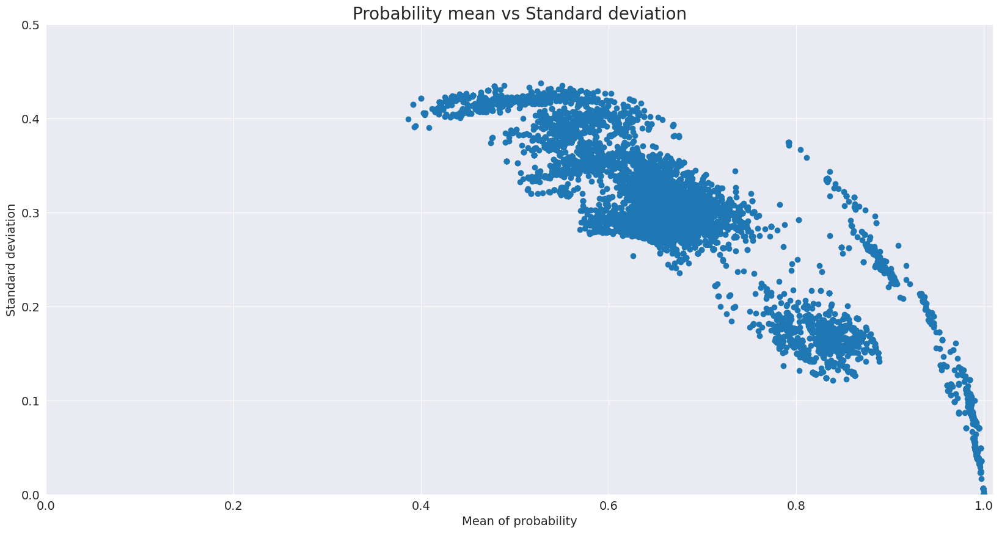

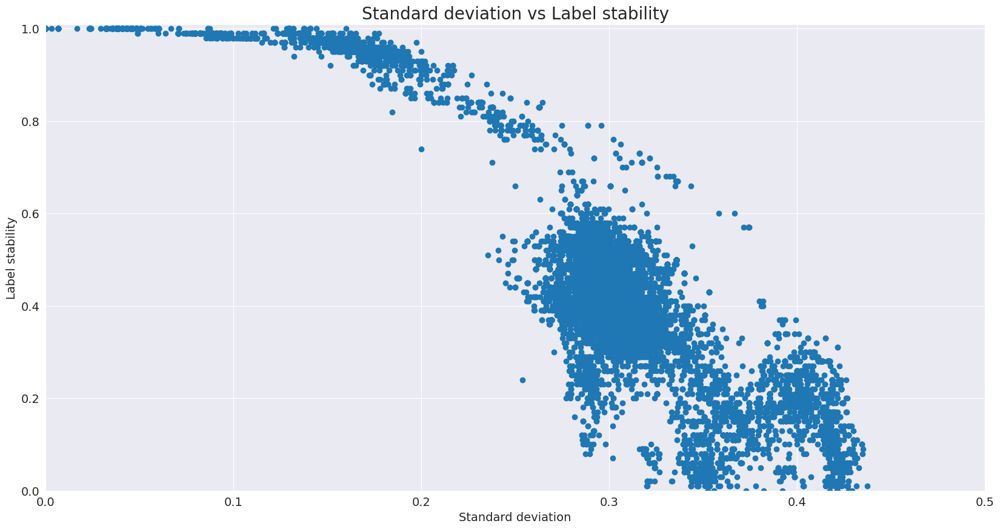

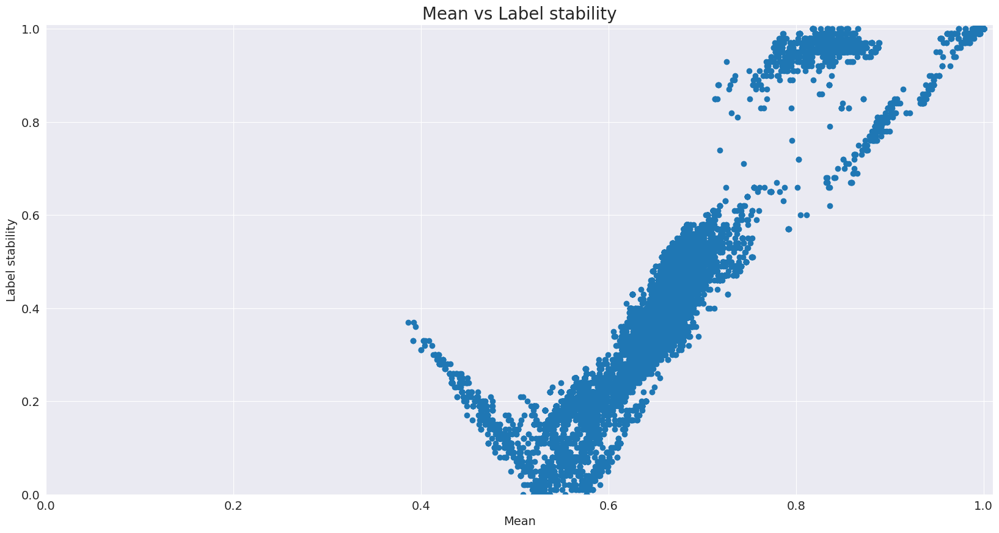

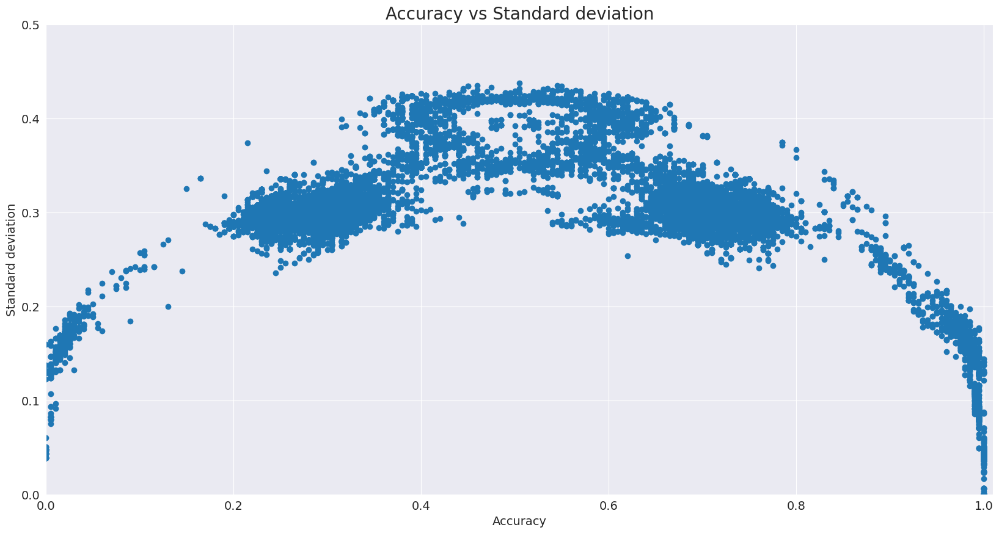

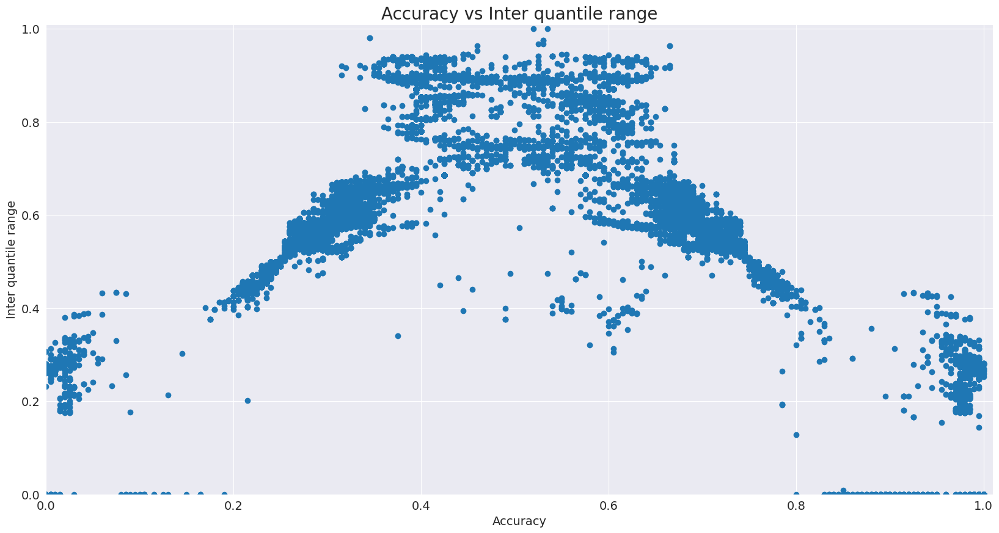

############################## Fairness metrics ##############################

#################### Accuracy ####################
              Race       Sex  Race_Sex
adv       0.520912  0.503940  0.486996
disadv    0.582817  0.556833  0.562404
Accuracy -0.061905 -0.052893 -0.075408

#################### Disparate_Impact ####################
                      Race       Sex  Race_Sex
adv               0.020658  0.023009  0.028447
disadv            0.006609  0.011298  0.005778
Disparate_Impact  0.319909  0.491014  0.203120

#################### Equal_Opportunity ####################
                       Race       Sex  Race_Sex
adv                0.014037  0.015078  0.018219
disadv             0.005473  0.008607  0.005296
Equal_Opportunity  0.008564  0.006471  0.012924

#################### Statistical_Parity_Difference ####################
                                   Race       Sex  Race_Sex
adv                            0.043798  0.047173  0.056568
disadv             

In [52]:
quantify_uncertainty(NULL_SCENARIO_NAME, y_data, imputed_data_dict, imputation_technique='impute-by-mean-trimmed')

### Impute-by-mean-conditional_SEX technique

X_train_imputed.shape:  (157573, 74)
X_test_imputed.shape:  (39394, 74)


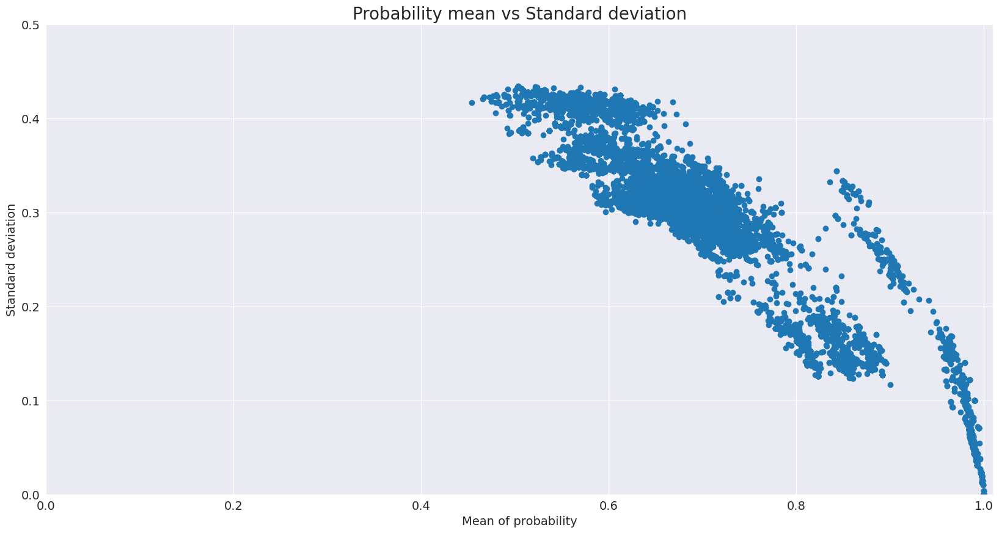

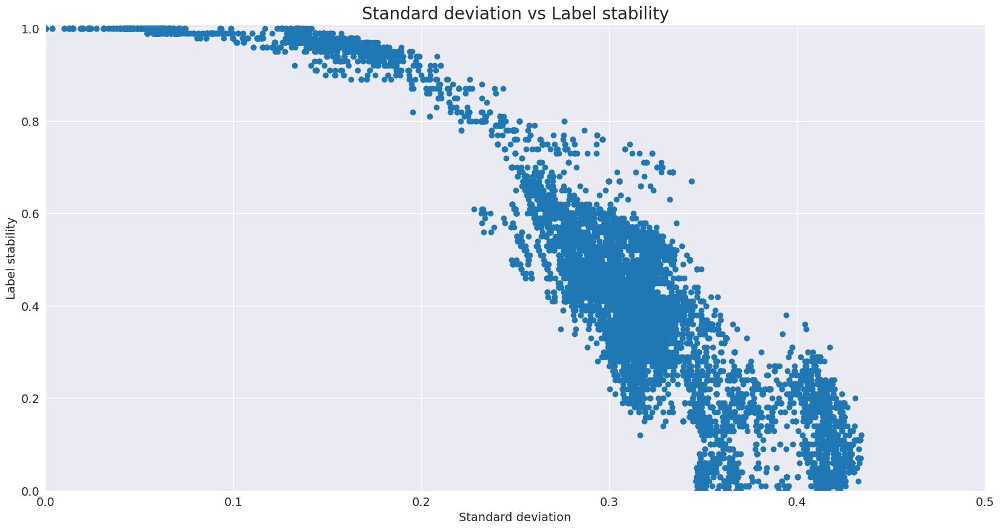

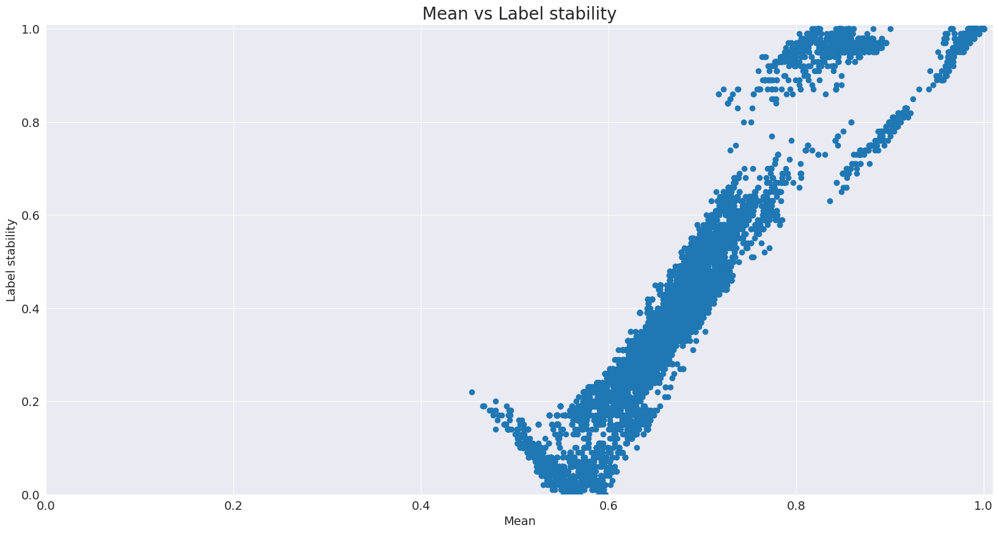

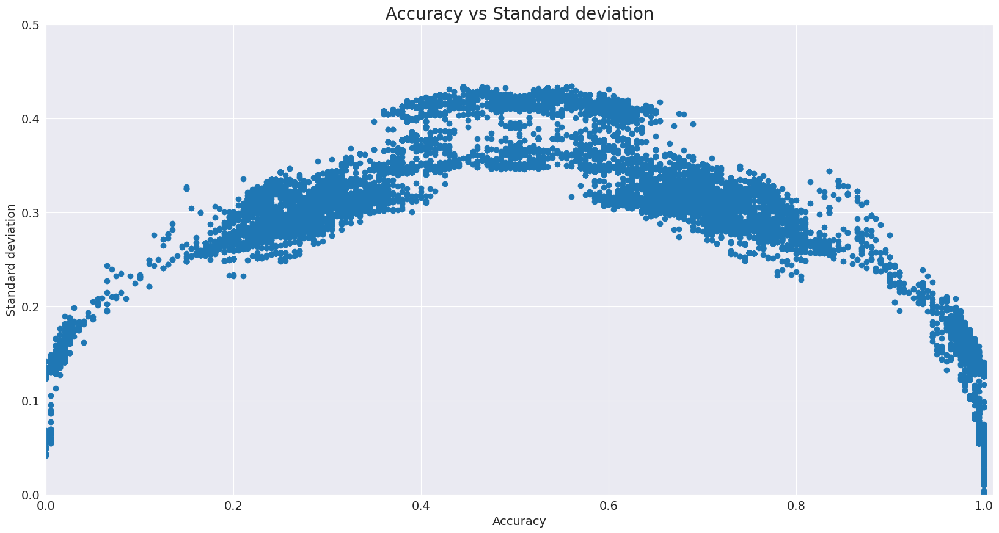

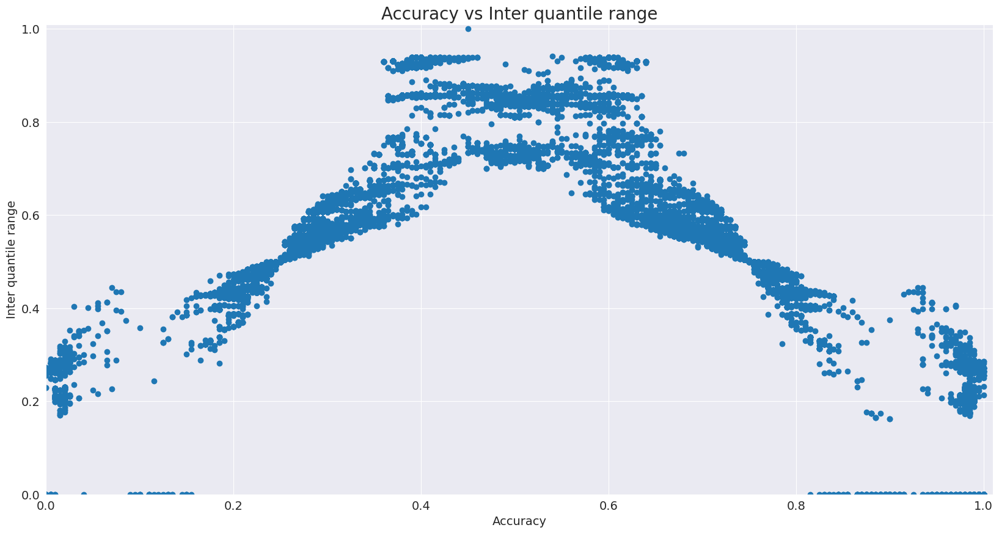

############################## Fairness metrics ##############################

#################### Accuracy ####################
              Race       Sex  Race_Sex
adv       0.527677  0.511452  0.496084
disadv    0.584882  0.560222  0.563559
Accuracy -0.057205 -0.048770 -0.067475

#################### Disparate_Impact ####################
                      Race       Sex  Race_Sex
adv               0.000868  0.001523   0.00133
disadv            0.000000  0.000639   0.00000
Disparate_Impact  0.000000  0.419166   0.00000

#################### Equal_Opportunity ####################
                      Race       Sex  Race_Sex
adv                0.00023  0.000754  0.000294
disadv             0.00000  0.000335  0.000000
Equal_Opportunity  0.00023  0.000419  0.000294

#################### Statistical_Parity_Difference ####################
                                   Race       Sex  Race_Sex
adv                            0.001841  0.003123  0.002645
disadv                 

In [91]:
quantify_uncertainty(NULL_SCENARIO_NAME, y_data, imputed_data_dict, imputation_technique='impute-by-mean-conditional_SEX')

### Impute-by-mean-conditional_RAC1P technique

X_train_imputed.shape:  (157573, 74)
X_test_imputed.shape:  (39394, 74)


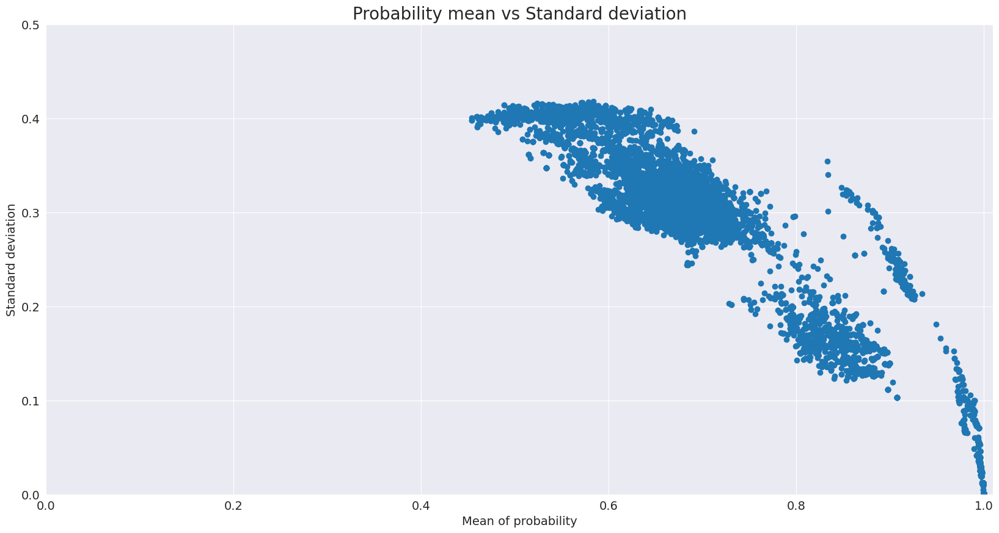

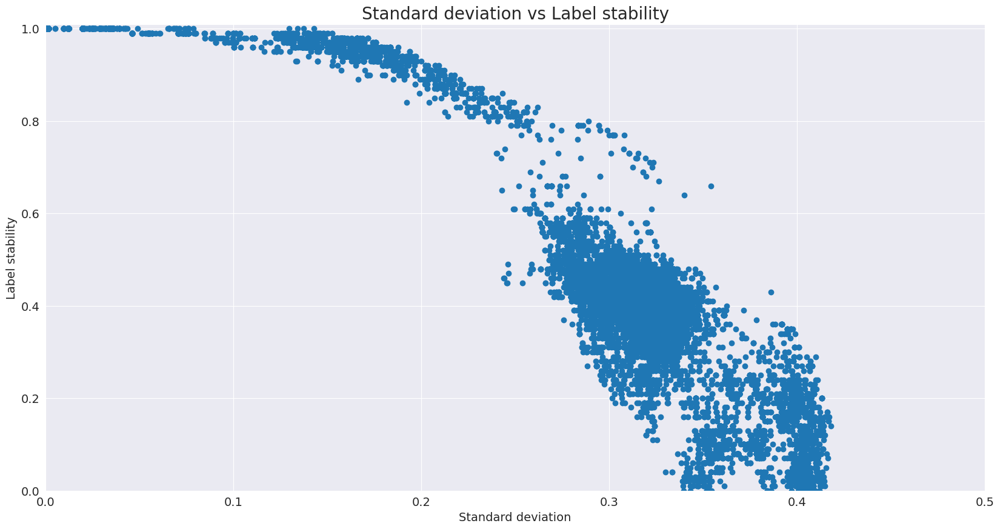

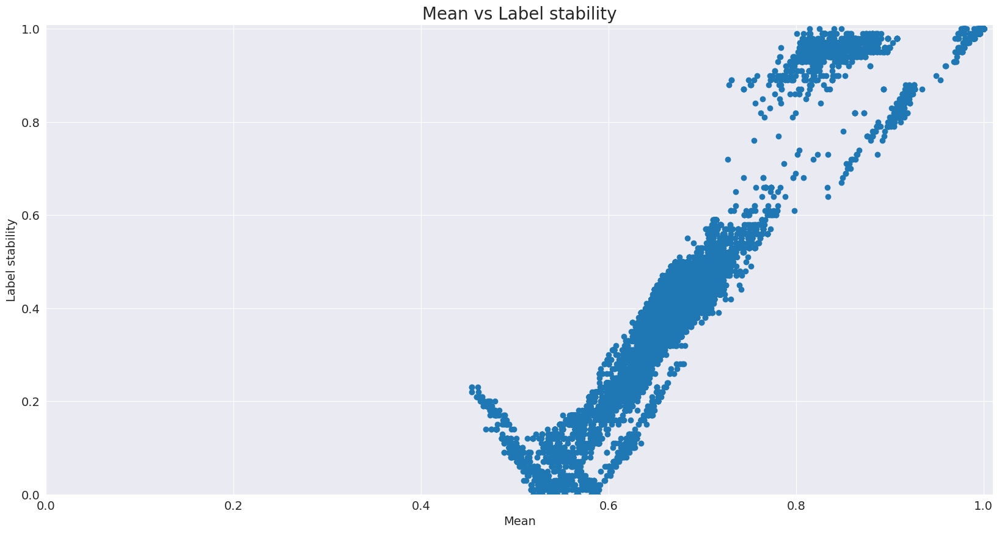

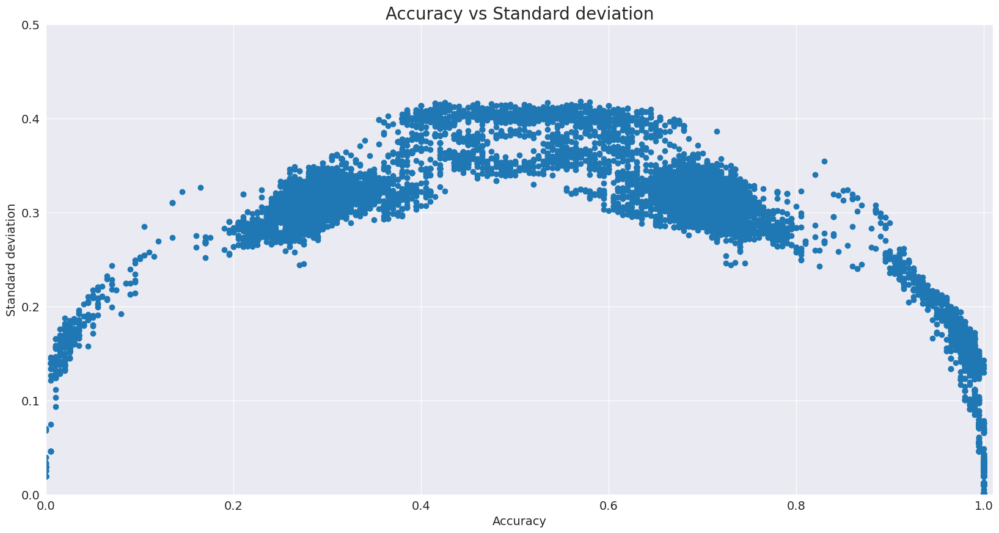

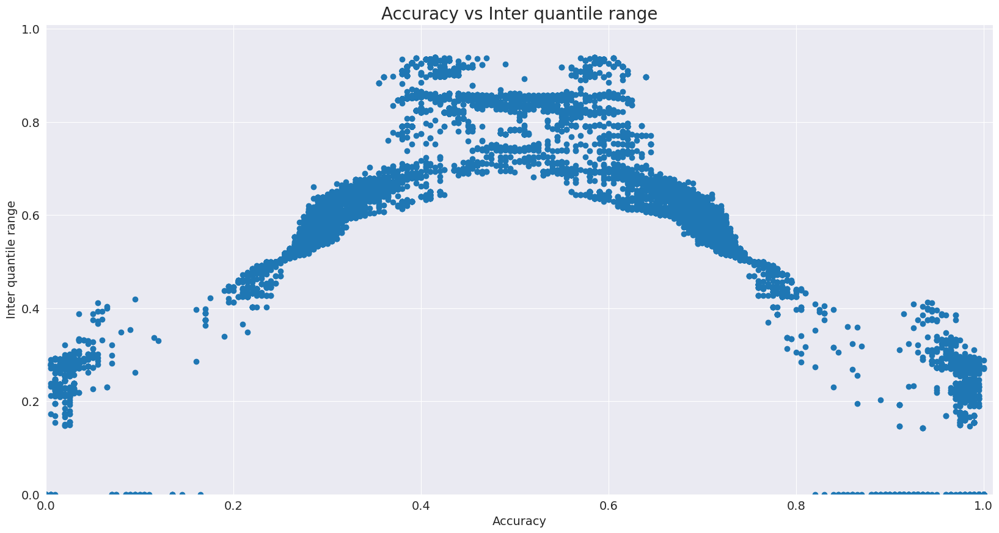

############################## Fairness metrics ##############################

#################### Accuracy ####################
              Race       Sex  Race_Sex
adv       0.525977  0.510296  0.495123
disadv    0.584676  0.558699  0.563559
Accuracy -0.058699 -0.048403 -0.068436

#################### Disparate_Impact ####################
                      Race       Sex  Race_Sex
adv               0.006910  0.006777  0.007463
disadv            0.001033  0.005502  0.001541
Disparate_Impact  0.149434  0.811837  0.206471

#################### Equal_Opportunity ####################
                       Race       Sex  Race_Sex
adv                0.004832  0.004954  0.005436
disadv             0.000995  0.004136  0.001765
Equal_Opportunity  0.003837  0.000818  0.003671

#################### Statistical_Parity_Difference ####################
                                   Race       Sex  Race_Sex
adv                            0.014651  0.013893  0.014840
disadv             

In [92]:
quantify_uncertainty(NULL_SCENARIO_NAME, y_data, imputed_data_dict, imputation_technique='impute-by-mean-conditional_RAC1P')

### Impute-by-median technique

X_train_imputed.shape:  (157573, 74)
X_test_imputed.shape:  (39394, 74)


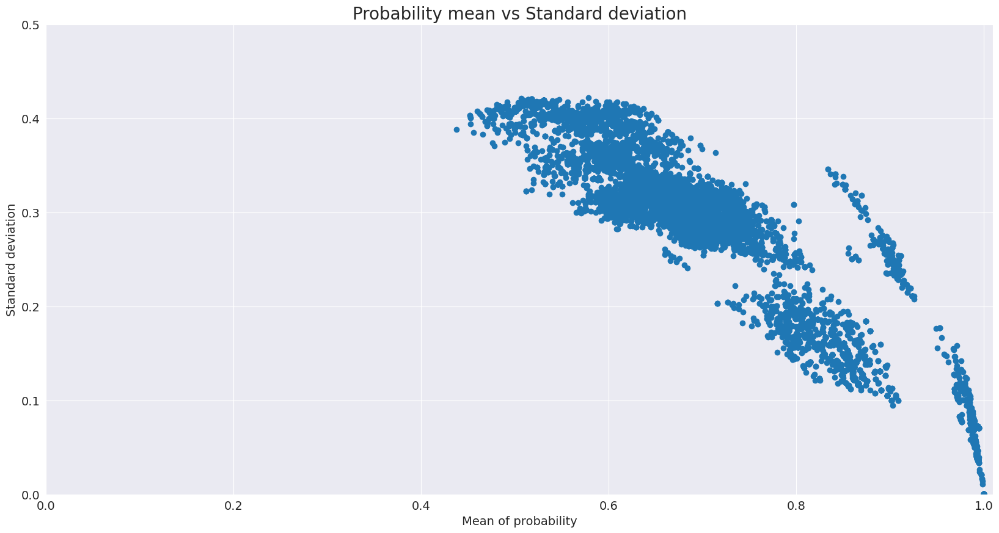

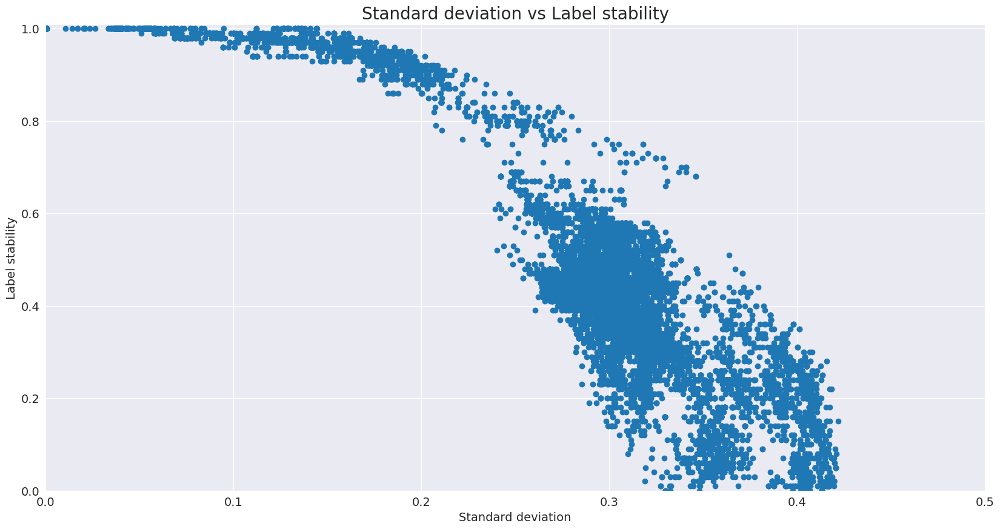

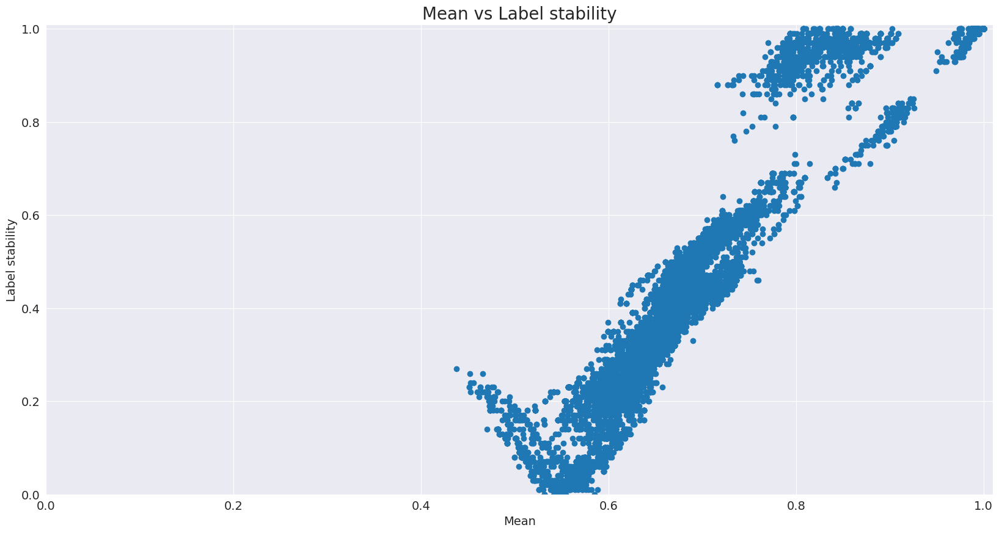

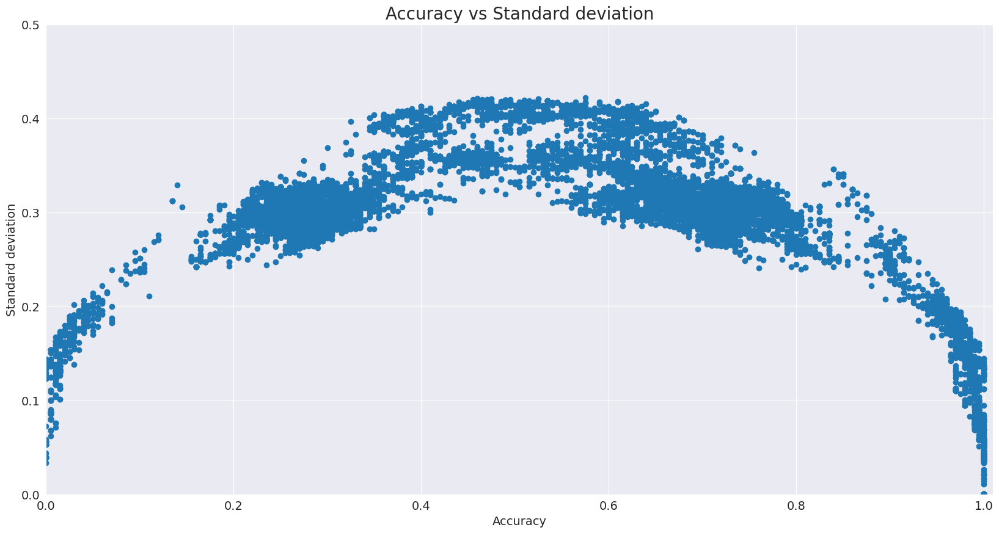

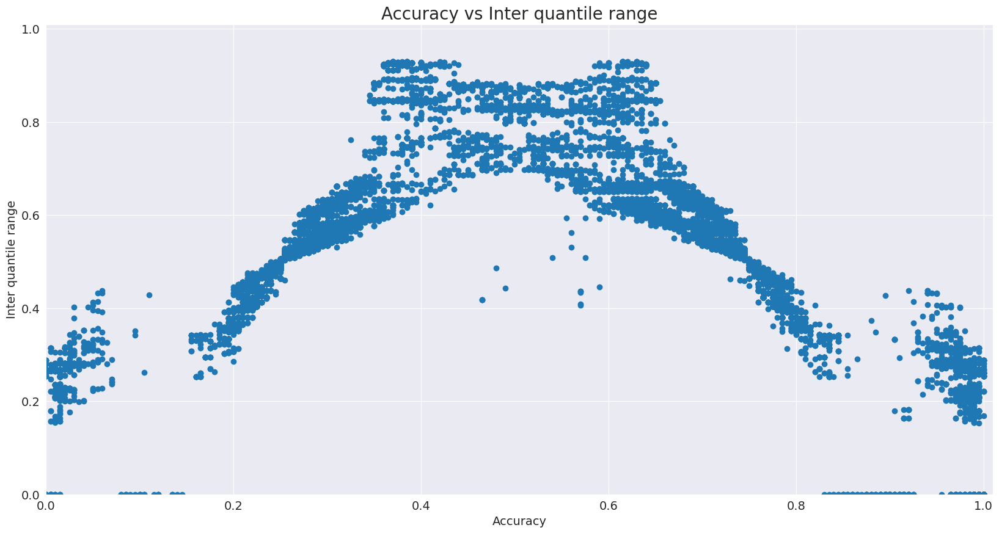

############################## Fairness metrics ##############################

#################### Accuracy ####################
              Race       Sex  Race_Sex
adv       0.527026  0.510769  0.495788
disadv    0.584676  0.559338  0.563559
Accuracy -0.057650 -0.048569 -0.067771

#################### Disparate_Impact ####################
                      Race       Sex  Race_Sex
adv               0.003907  0.004308  0.004138
disadv            0.001033  0.003389  0.000770
Disparate_Impact  0.264277  0.786821  0.186193

#################### Equal_Opportunity ####################
                       Race       Sex  Race_Sex
adv                0.002761  0.002908  0.002792
disadv             0.000995  0.002459  0.000883
Equal_Opportunity  0.001766  0.000449  0.001909

#################### Statistical_Parity_Difference ####################
                                   Race       Sex  Race_Sex
adv                            0.008284  0.008831  0.008228
disadv             

In [93]:
quantify_uncertainty(NULL_SCENARIO_NAME, y_data, imputed_data_dict, imputation_technique='impute-by-median')

### Impute-by-median-trimmed technique

X_train_imputed.shape:  (157573, 74)
X_test_imputed.shape:  (39394, 74)


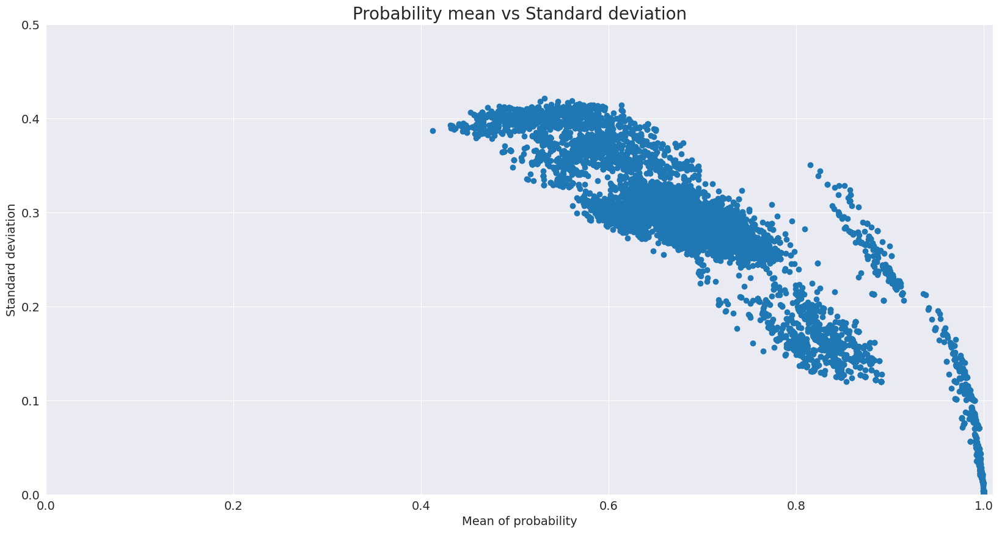

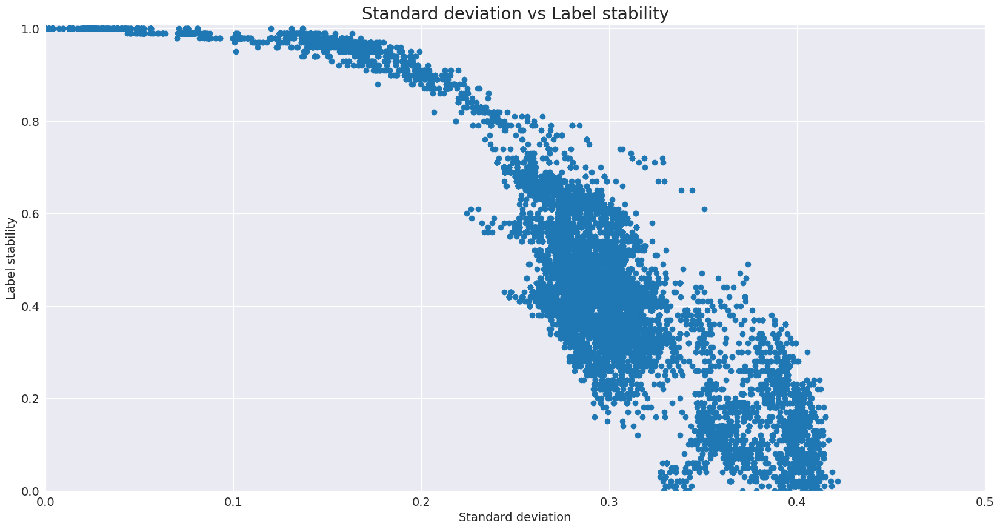

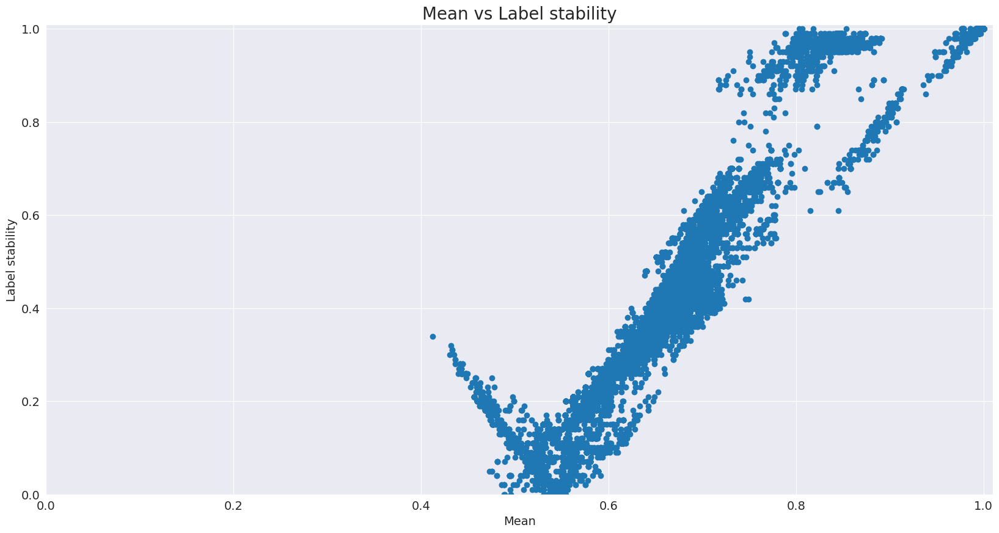

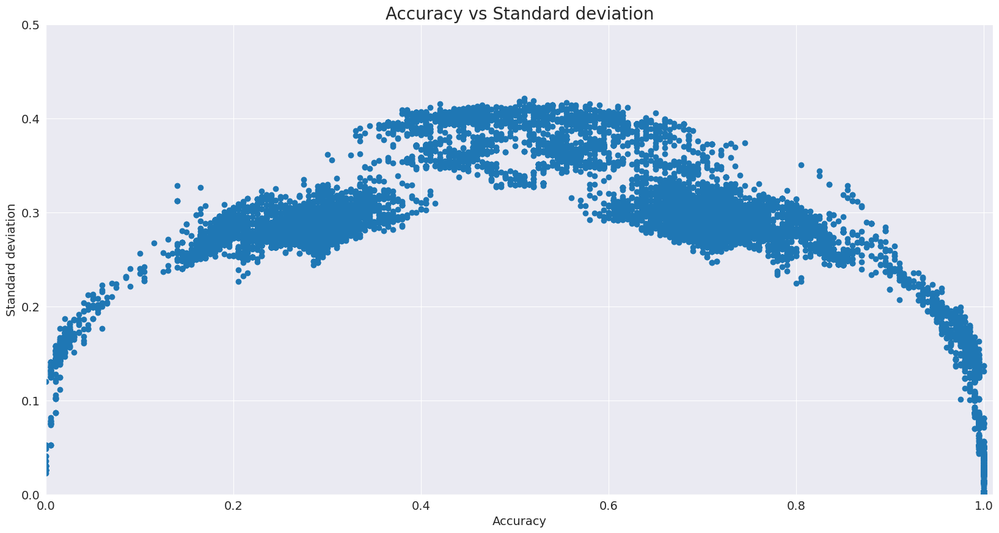

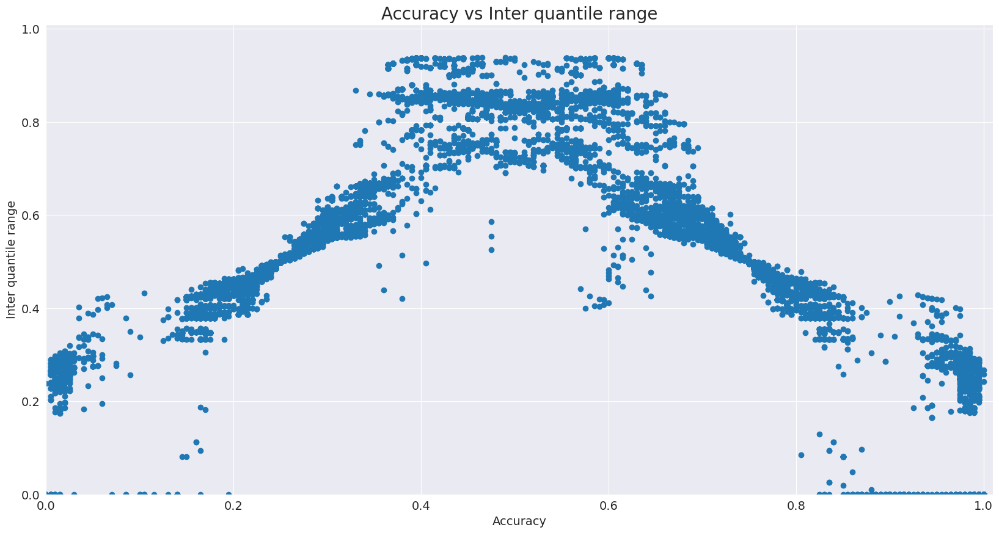

############################## Fairness metrics ##############################

#################### Accuracy ####################
              Race       Sex  Race_Sex
adv       0.523155  0.507985  0.491798
disadv    0.584469  0.556931  0.563174
Accuracy -0.061314 -0.048946 -0.071376

#################### Disparate_Impact ####################
                      Race       Sex  Race_Sex
adv               0.018632  0.018754  0.023201
disadv            0.002478  0.011494  0.002696
Disparate_Impact  0.133011  0.612898  0.116222

#################### Equal_Opportunity ####################
                       Race       Sex  Race_Sex
adv                0.014267  0.014863  0.017778
disadv             0.002488  0.008943  0.002648
Equal_Opportunity  0.011780  0.005920  0.015131

#################### Statistical_Parity_Difference ####################
                                   Race       Sex  Race_Sex
adv                            0.039503  0.038449  0.046136
disadv             

In [94]:
quantify_uncertainty(NULL_SCENARIO_NAME, y_data, imputed_data_dict, imputation_technique='impute-by-median-trimmed')

### Impute-by-median-conditional_SEX technique

X_train_imputed.shape:  (157573, 74)
X_test_imputed.shape:  (39394, 74)


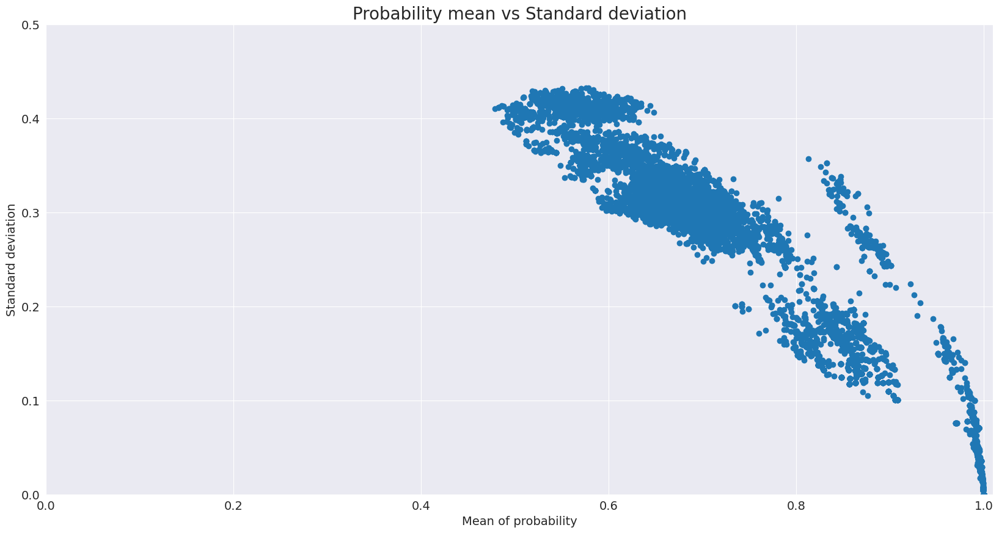

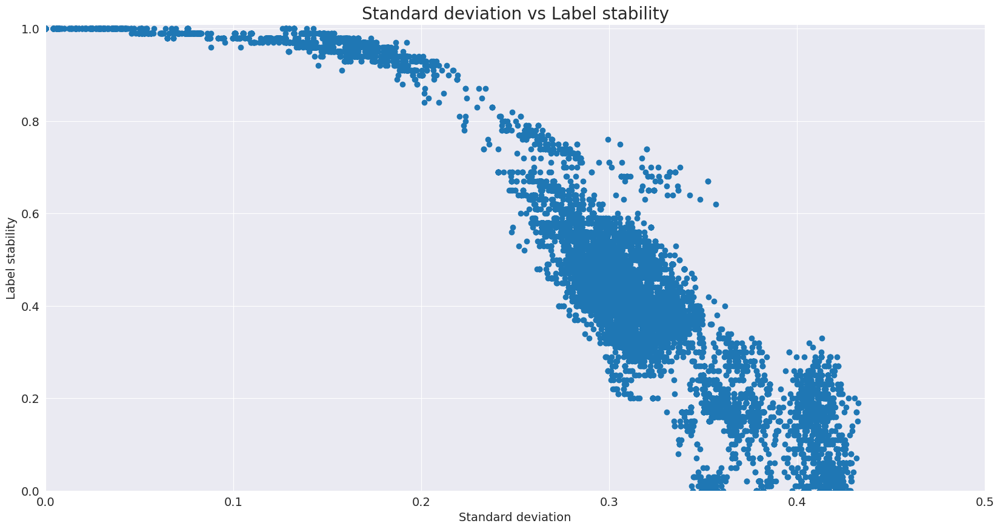

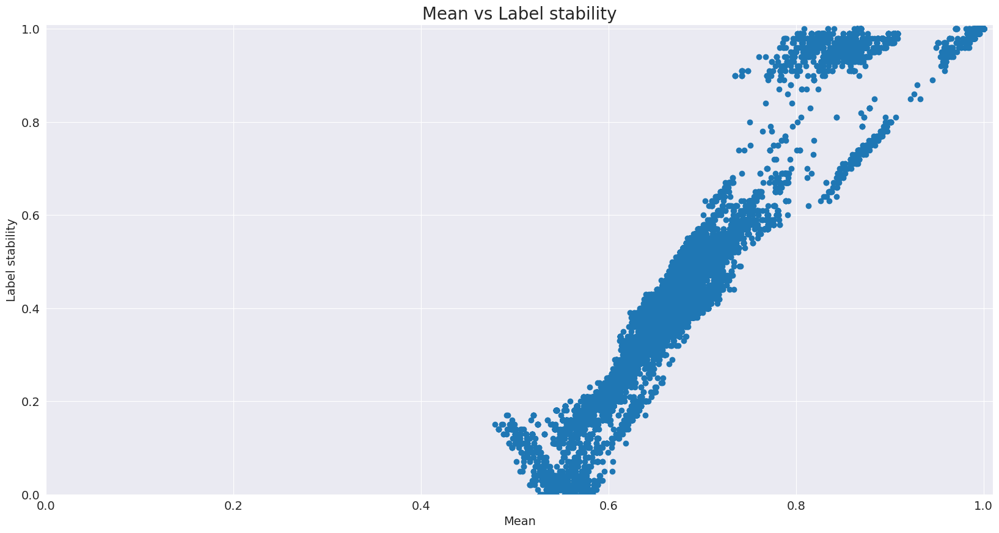

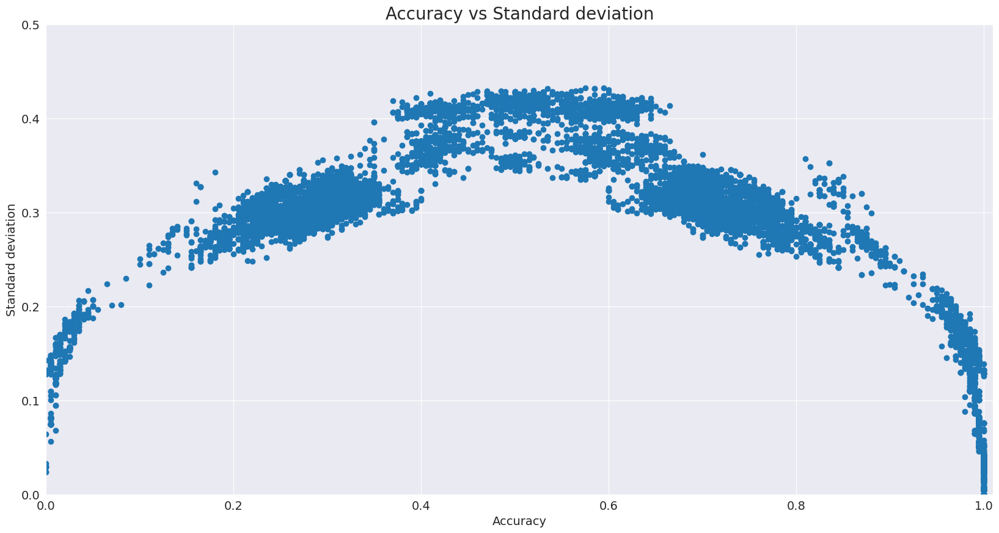

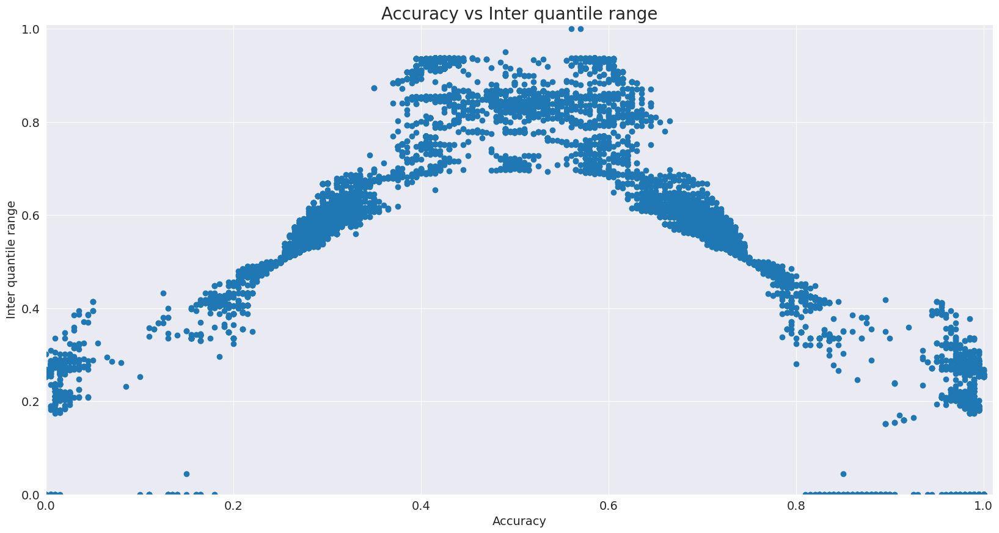

############################## Fairness metrics ##############################

#################### Accuracy ####################
              Race       Sex  Race_Sex
adv       0.527858  0.511715  0.496749
disadv    0.585089  0.560075  0.563559
Accuracy -0.057231 -0.048360 -0.066810

#################### Disparate_Impact ####################
                      Race       Sex  Race_Sex
adv               0.000687  0.000630  0.000369
disadv            0.000207  0.001179  0.000000
Disparate_Impact  0.300441  1.870125  0.000000

#################### Equal_Opportunity ####################
                       Race       Sex  Race_Sex
adv                0.000230  0.000108       0.0
disadv             0.000498  0.000782       0.0
Equal_Opportunity -0.000267 -0.000675       0.0

#################### Statistical_Parity_Difference ####################
                                   Race       Sex  Race_Sex
adv                            0.001457  0.001292  0.000735
disadv             

In [95]:
quantify_uncertainty(NULL_SCENARIO_NAME, y_data, imputed_data_dict, imputation_technique='impute-by-median-conditional_SEX')

### Impute-by-median-conditional_RAC1P technique

X_train_imputed.shape:  (157573, 74)
X_test_imputed.shape:  (39394, 74)


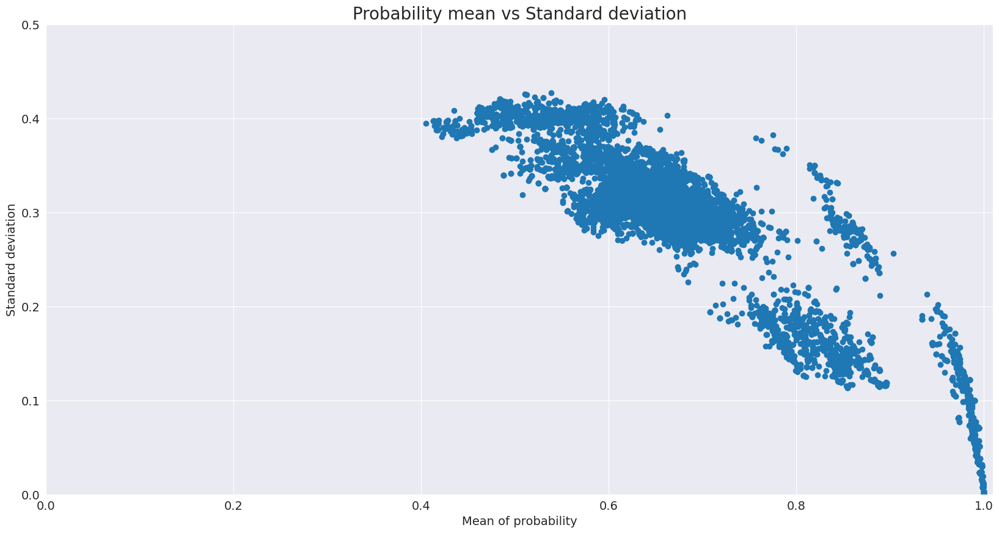

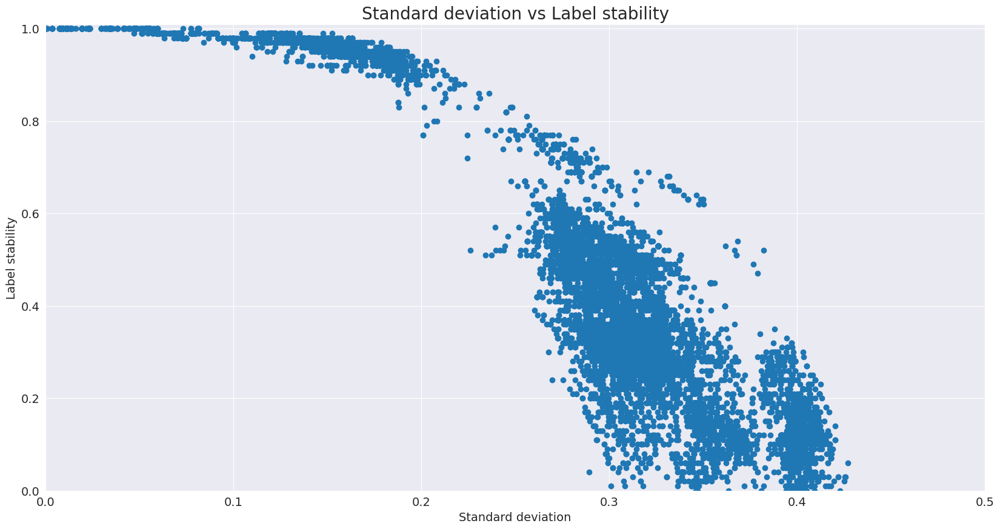

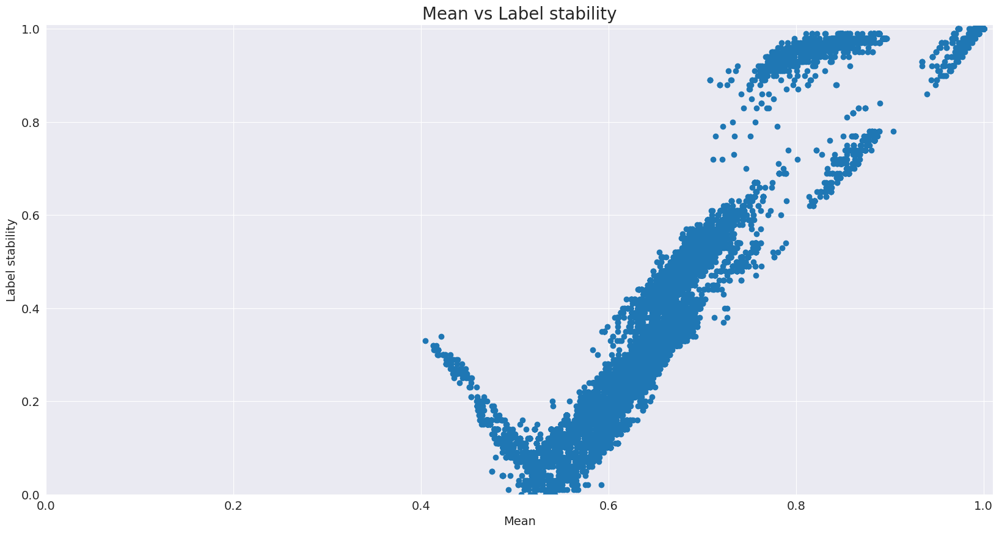

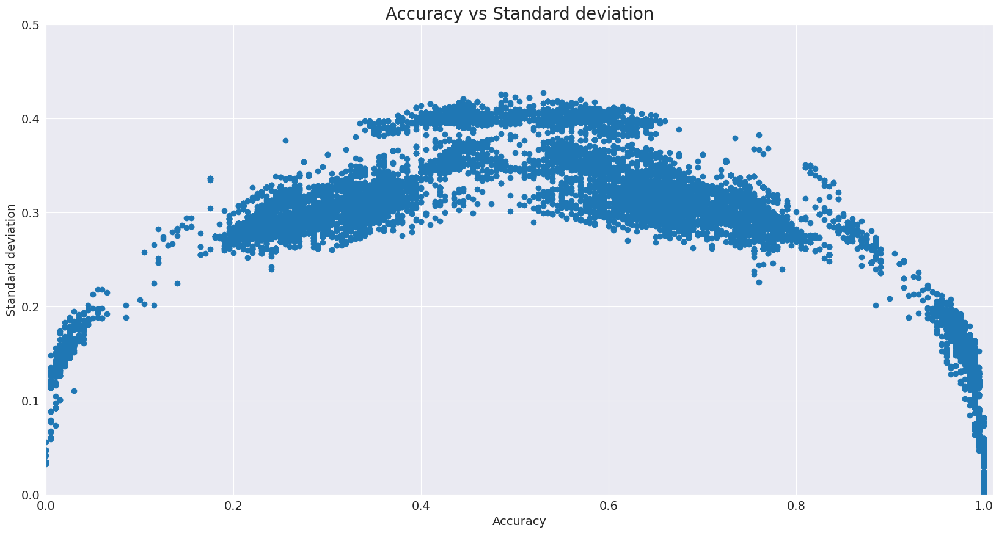

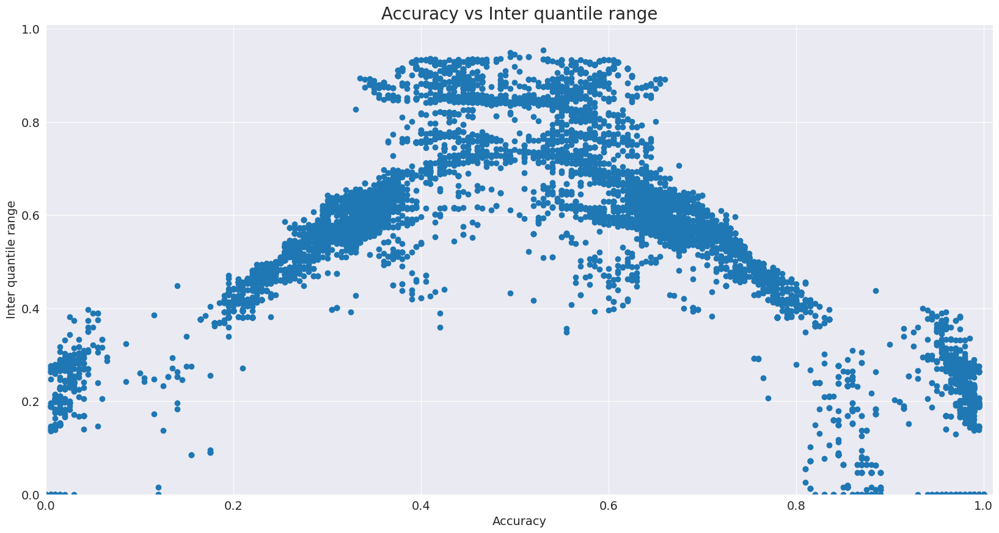

############################## Fairness metrics ##############################

#################### Accuracy ####################
              Race       Sex  Race_Sex
adv       0.520116  0.503940  0.486700
disadv    0.583643  0.555801  0.562404
Accuracy -0.063527 -0.051861 -0.075704

#################### Disparate_Impact ####################
                      Race       Sex  Race_Sex
adv               0.020297  0.020698  0.025787
disadv            0.004131  0.012526  0.005008
Disparate_Impact  0.203507  0.605180  0.194196

#################### Equal_Opportunity ####################
                       Race       Sex  Race_Sex
adv                0.012810  0.012709  0.015281
disadv             0.003483  0.008831  0.004413
Equal_Opportunity  0.009327  0.003878  0.010868

#################### Statistical_Parity_Difference ####################
                                   Race       Sex  Race_Sex
adv                            0.043031  0.042434  0.051278
disadv             

In [96]:
quantify_uncertainty(NULL_SCENARIO_NAME, y_data, imputed_data_dict, imputation_technique='impute-by-median-conditional_RAC1P')

## Display result plots

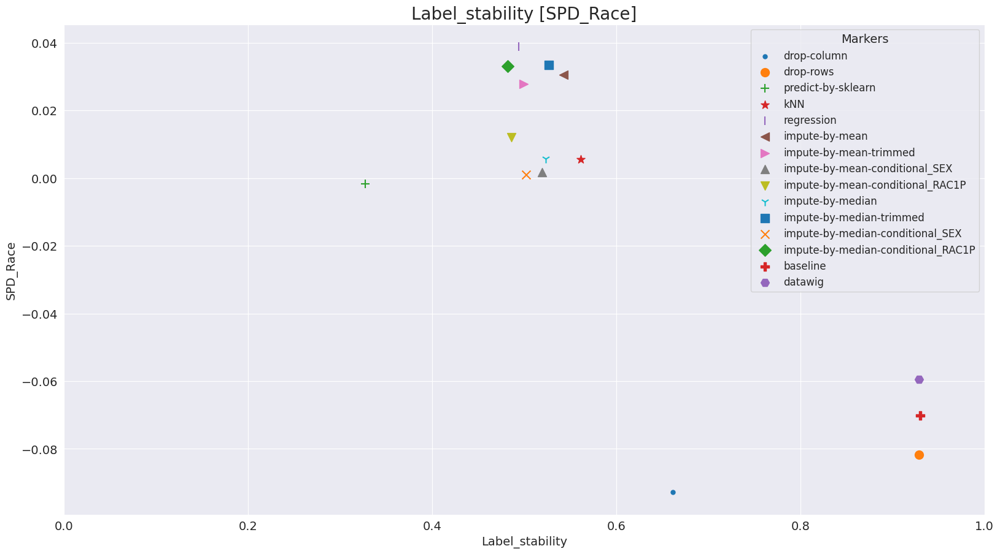

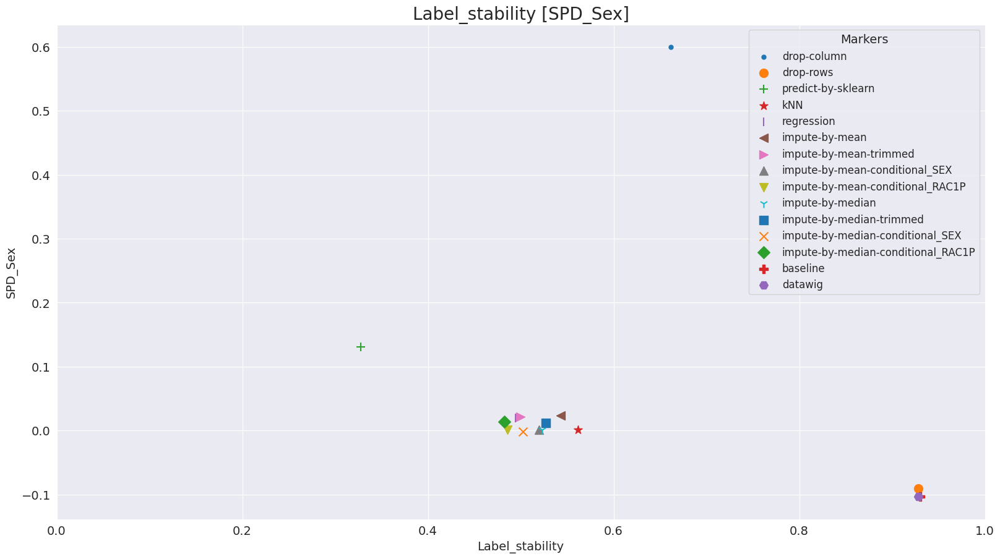

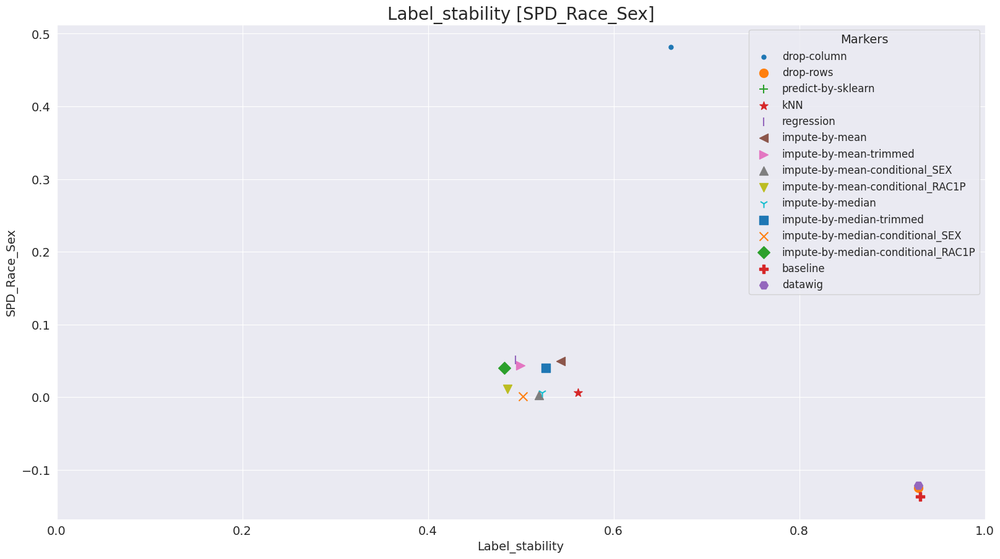

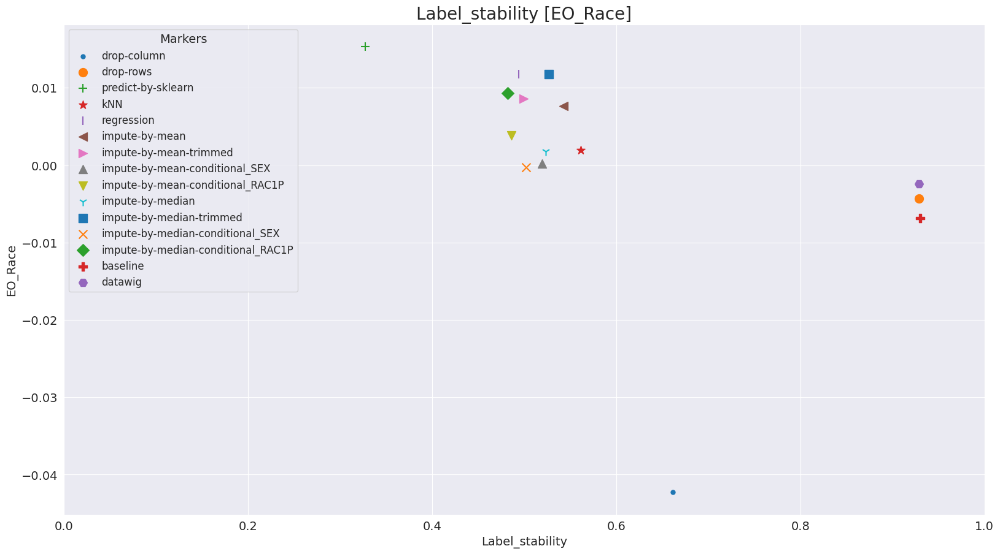

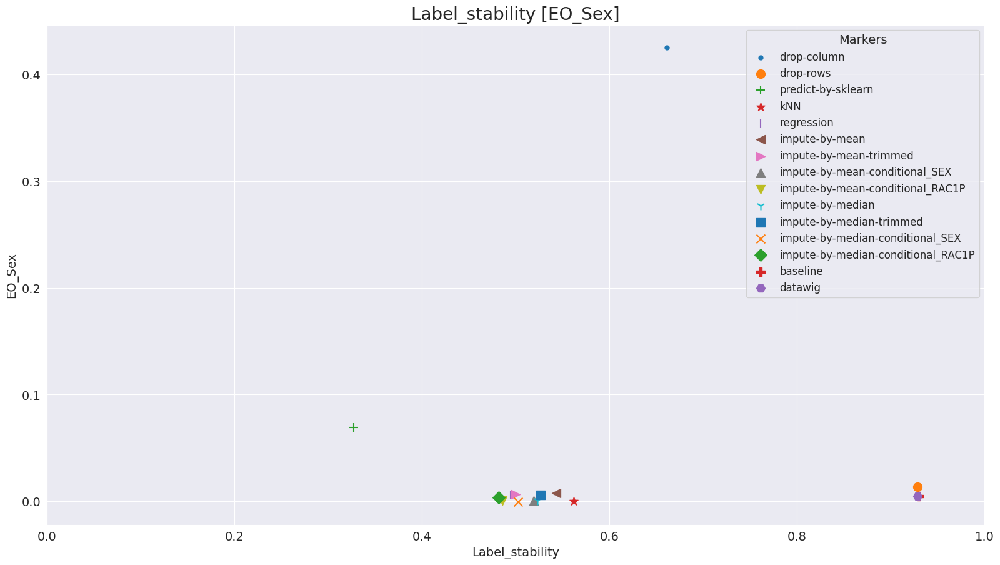

...

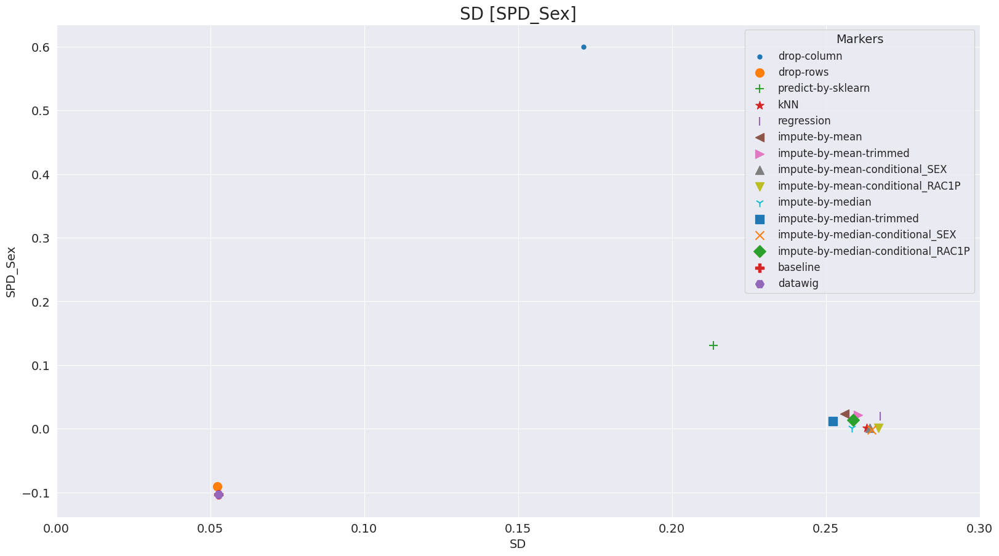

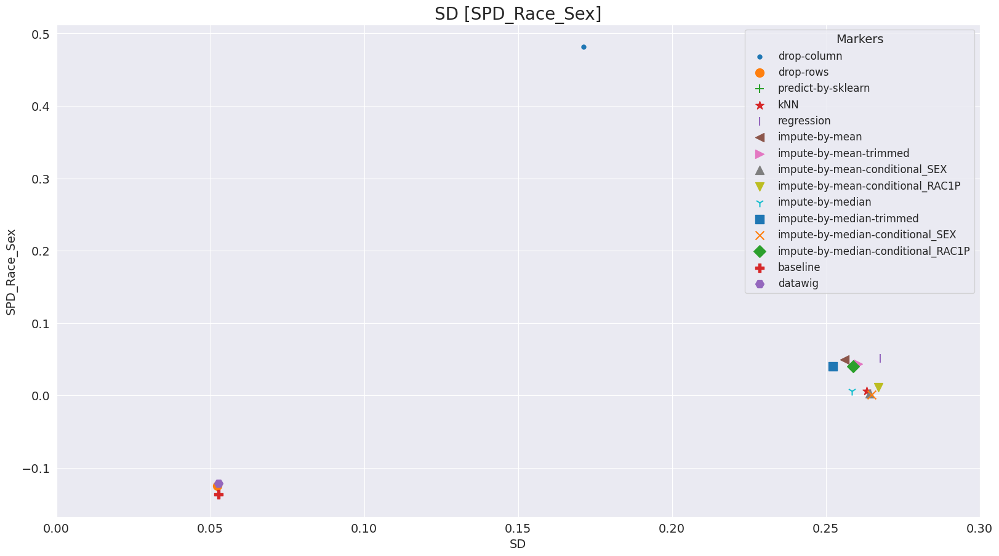

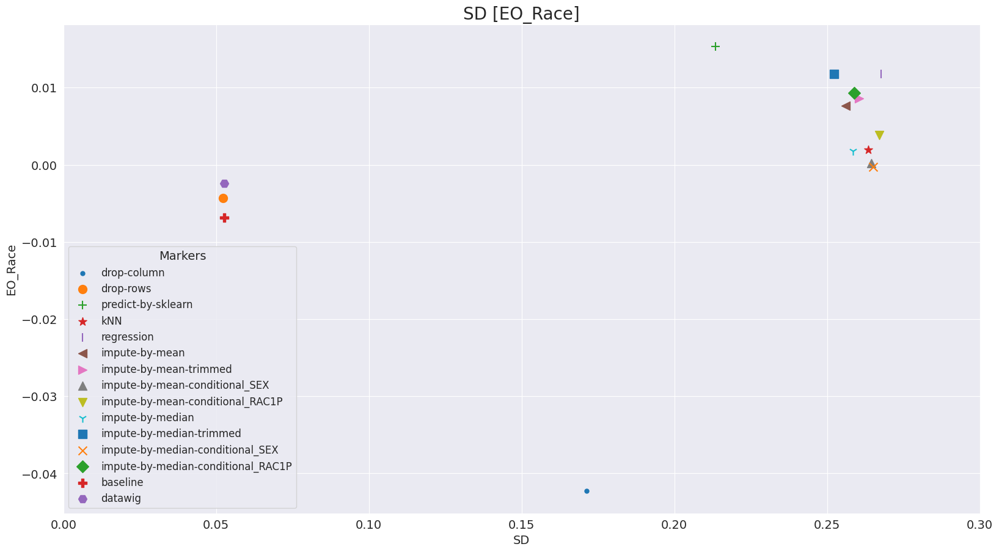

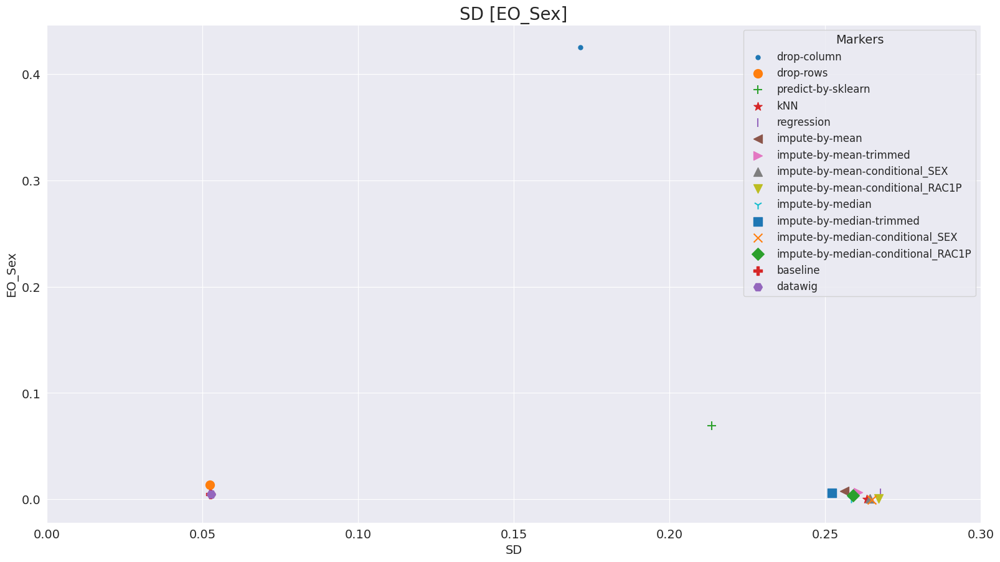

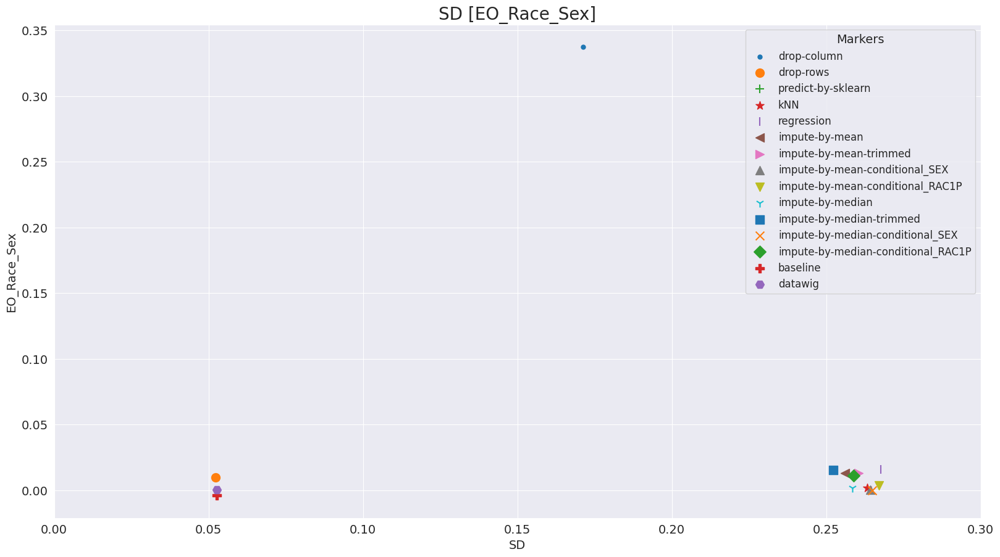

In [53]:
display_result_plots(NULL_SCENARIO_NAME, imputation_techniques)

In [1]:
# importing pandas as pd
import pandas as pd

# Creating the dataframe
df = pd.DataFrame({"A":[12, 4, 5, 44, 1],
                   "B":[5, 2, 54, 3, 2],
                   "C":[20, 16, 7, 3, 8],
                   "D":[14, 3, 17, 2, 6]})

# Print the dataframe
df

,A,B,C,D
0,12,5,20,14
1,4,2,16,3
2,5,54,7,17
3,44,3,3,2
4,1,2,8,6


In [2]:
df.mean()

A    13.2
B    13.2
C    10.8
D     8.4
dtype: float64